#### <img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 20px; height: 55px">

# Project 4 -  Data-backed solutions for combating West Nile Virus in Chicago

### Contents:
- [Background](#Background)
- [Data Import & Cleaning](#Data-Import-&-Cleaning)
- [Preprocessing and Feature Engineering](#Preprocessing-and-Feature-Engineering)
- [Exploratory Data Analysis](#Exploratory-Data-Analysis)
- [Modeling](#Modeling)
- [Kaggle Submission](#Kaggle-Submission)
- [Key Insights & Recommendations](#Conclusion)

# Background

West Nile virus (WNV) is an infectious viral disease transmitted by mosquitoes, which can lead to flu-like symptoms, neurological complications, and potentially fatal illnesses in humans.

In the year 2002, the initial human cases of West Nile virus were reported in the city of Chicago. Subsequently, the City of Chicago and the **Chicago Department of Public Health (CDPH)** took significant measures to establish a comprehensive surveillance and control program. This program has been diligently maintained and remains in operation to this day. Over the course of 12 years, substantial efforts have been invested in combating the spread of West Nile Virus, resulting in the accumulation of a vast amount of data by the **CDPH**. This rich dataset now serves as a valuable resource for making evidence-based decisions.

Reference Website
- [Centre for Disease Control and Prevention](https://www.cdc.gov/about/index.html)
- [Chicago Department of Public Health](https://www.chicago.gov/city/en/depts/cdph.html)

## Datasets

Public health workers in Chicago setup mosquito traps scattered across the city. The captured mosquitos are tested for the presence of West Nile virus.

* [`train.csv`](../assets/train.csv): The "train.csv" dataset comprises information regarding the geographical coordinates of mosquito traps, the count of mosquitos captured in each trap, and the presence or absence of the West Nile Virus. The dataset encompasses data collected during the years 2007, 2009, 2011, and 2013.

* [`test.csv`](../assets/test.csv): The "test.csv" dataset comprises information regarding the geographical coordinates of mosquito traps and the count of mosquitos captured in each trap. The dataset encompasses data collected during the years 2008, 2010, 2012, and 2014. We are to use test.csv to evaluate the results of machine learning.

* [`spray.csv`](../assets/spray.csv): The spray.csv consists of GIS data for City of Chicago spray efforts in 2011 and 2013. 

* [`weather.csv`](../assets/weather.csv): The weather.csv consists of weather condition data collected by National Oceanic and Atmospheric Administration (NOAA) from year 2007 to 2014.

## Problem Statement

We, **Data Nine-Nine**, have been engaged as a third-party consulting firm by the **Centre for Disease Control and Prevention (CDC)** to collaborate on a comprehensive review of their West Nile virus control efforts. Our objective is to
<br>
1. build machine learning model to predict the presence of WNV;
2. providing valuable insights and recommendations to further enhance their strategies 
<br>

in combatting the West Nile virus outbreak.

## Project Deliverables

Our project is centered around the following objectives:

1. Conduct comprehensive **research** on the occurrence and prevalence of the West Nile virus in the city of Chicago.
2. Develop and **train a machine learning model** capable of accurately predicting the probability of the presence of the West Nile virus.
3. Share our **insights and recommendations** with the esteemed members of the Centers for Disease Control and Prevention (CDC), including biostatisticians and epidemiologists.
4. Provide a thorough **cost-benefit analysis** to support the CDC members in making informed decisions based on data-driven recommendations for the future.

## Outside Research

...

---
## **Data Import & Cleaning**

In [2]:
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import pickle

# Import for modeling
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import classification_report, recall_score, precision_score, confusion_matrix, roc_auc_score, roc_curve, auc, RocCurveDisplay, ConfusionMatrixDisplay, f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, VotingClassifier
from xgboost import XGBClassifier

# To view more columns
pd.options.display.max_columns=30

In [3]:
# Create a function to import the identified data files:

def import_data(dict_of_file_paths):
    def pd_read_csv(file_path):
        return pd.read_csv(file_path)
    
    dataframes = {}

    for key, file_path in dict_of_file_paths.items():
        dataframes[f'{key}_df'] = pd_read_csv(file_path)

    return dataframes

In [4]:
# Define dictionary of file paths to be passed into the import_data function

file_paths = {
    'train': '../assets/train.csv',
    'spray': '../assets/spray.csv',
    'test': '../assets/test.csv',
    'weather': '../assets/weather.csv'
}

In [5]:
# Assign output of import_data to the variable dataframes
dataframes = import_data(file_paths)

# Print keys of dataframes to see how many dataframes we have
dataframes.keys()

dict_keys(['train_df', 'spray_df', 'test_df', 'weather_df'])

### Inspecting all datasets

In [6]:
for each_df in dataframes.keys():
    print(f'{each_df}: ---------------------------------------------------' '\n')
    dataframes[each_df].info()
    print()
    print('++++++++++')
    print()
    print(f'Check of null values for {each_df}:')
    print(dataframes[each_df].isnull().sum())
    print()

train_df: ---------------------------------------------------

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10506 entries, 0 to 10505
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Date                    10506 non-null  object 
 1   Address                 10506 non-null  object 
 2   Species                 10506 non-null  object 
 3   Block                   10506 non-null  int64  
 4   Street                  10506 non-null  object 
 5   Trap                    10506 non-null  object 
 6   AddressNumberAndStreet  10506 non-null  object 
 7   Latitude                10506 non-null  float64
 8   Longitude               10506 non-null  float64
 9   AddressAccuracy         10506 non-null  int64  
 10  NumMosquitos            10506 non-null  int64  
 11  WnvPresent              10506 non-null  int64  
dtypes: float64(2), int64(4), object(6)
memory usage: 985.1+ KB

++++++++++

Check of 

In [7]:
#printing out missing values in weather.csv
dataframes['weather_df'] = pd.read_csv('../assets/weather.csv', na_values=['-', 'M'])
dataframes['weather_df'].isnull().sum()

Station           0
Date              0
Tmax              0
Tmin              0
Tavg             11
Depart         1472
DewPoint          0
WetBulb           4
Heat             11
Cool             11
Sunrise        1472
Sunset         1472
CodeSum           0
Depth          1472
Water1         2944
SnowFall       1472
PrecipTotal       2
StnPressure       4
SeaLevel          9
ResultSpeed       0
ResultDir         0
AvgSpeed          3
dtype: int64

**Summary**
* `train_df`: no null values  
* `test_df`: no null values  
* `spray_df`:  
    * `Time`: 584 null
* `weather_df`:
    * `Tavg`, `Heat`, `Cool`: 11 null
    * `Depart`, `Sunrise`, `Sunset`, `Depth`, `SnowFall`: 1472 null
    * `WetBulb`, `StnPressure`: 4 null
    * `PrecipTotal`: 2 null
    * `SeaLevel`: 9 null
    * `AvgSpeed`: 3 null


**Analysis**

1. Only the `Time` column in spray_df is showing 584 null values
2. However, from `weather.csv`, we know that there are '-' and 'M' (Missing) which are treated as null values, and 'T' (Trace) which will be cleaned later.

We will clean the data a set at a time.

---
# **Preprocessing and Feature Engineering** 

## 1) Train and Test Dataset

In [8]:
train_df = dataframes['train_df']
display(train_df.head())

test_df = dataframes['test_df']
display(test_df.head())

,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent
0,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9,1,0
1,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9,1,0
2,2007-05-29,"6200 North Mandell Avenue, Chicago, IL 60646, USA",CULEX RESTUANS,62,N MANDELL AVE,T007,"6200 N MANDELL AVE, Chicago, IL",41.994991,-87.769279,9,1,0
3,2007-05-29,"7900 West Foster Avenue, Chicago, IL 60656, USA",CULEX PIPIENS/RESTUANS,79,W FOSTER AVE,T015,"7900 W FOSTER AVE, Chicago, IL",41.974089,-87.824812,8,1,0
4,2007-05-29,"7900 West Foster Avenue, Chicago, IL 60656, USA",CULEX RESTUANS,79,W FOSTER AVE,T015,"7900 W FOSTER AVE, Chicago, IL",41.974089,-87.824812,8,4,0


,Id,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy
0,1,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9
1,2,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9
2,3,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9
3,4,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX SALINARIUS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9
4,5,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX TERRITANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9


### Standardizing Feature Names via Snake-Case and Lower-Case

In [9]:
# Convert column names to snake_case
def convert_to_snake_case(text):
    words = re.findall(r'[A-Z][a-z0-9]*', text)
    snake_case_name = '_'.join(words).lower()
    return snake_case_name

train_df.columns = [convert_to_snake_case(column) for column in train_df.columns]
test_df.columns = [convert_to_snake_case(column) for column in test_df.columns]

In [10]:
print(train_df.columns)
print(test_df.columns)

Index(['date', 'address', 'species', 'block', 'street', 'trap',
       'address_number_and_street', 'latitude', 'longitude',
       'address_accuracy', 'num_mosquitos', 'wnv_present'],
      dtype='object')
Index(['id', 'date', 'address', 'species', 'block', 'street', 'trap',
       'address_number_and_street', 'latitude', 'longitude',
       'address_accuracy'],
      dtype='object')


In [11]:
# Change date column to datetime object
train_df['date']=pd.to_datetime(train_df['date'])
test_df['date']=pd.to_datetime(test_df['date'])

In [12]:
# Creating date features
train_df['year'] = train_df['date'].dt.year
train_df['month'] = train_df['date'].dt.month
train_df['day'] = train_df['date'].dt.day
train_df['week'] = train_df['date'].dt.isocalendar().week
train_df['dayofweek'] = train_df['date'].dt.dayofweek
train_df['dayofyear'] = train_df['date'].dt.dayofyear

test_df['year'] = test_df['date'].dt.year
test_df['month'] = test_df['date'].dt.month
test_df['day'] = test_df['date'].dt.day
test_df['week'] = test_df['date'].dt.isocalendar().week
test_df['dayofweek'] = test_df['date'].dt.dayofweek
test_df['dayofyear'] = test_df['date'].dt.dayofyear

In [13]:
print(train_df.info())
print(test_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10506 entries, 0 to 10505
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   date                       10506 non-null  datetime64[ns]
 1   address                    10506 non-null  object        
 2   species                    10506 non-null  object        
 3   block                      10506 non-null  int64         
 4   street                     10506 non-null  object        
 5   trap                       10506 non-null  object        
 6   address_number_and_street  10506 non-null  object        
 7   latitude                   10506 non-null  float64       
 8   longitude                  10506 non-null  float64       
 9   address_accuracy           10506 non-null  int64         
 10  num_mosquitos              10506 non-null  int64         
 11  wnv_present                10506 non-null  int64         
 12  year

### Aggregating `num_mosquitos` Values 

We want to focus on combining the rows of datasets that shares the same date and location. Since the total number of mosquitos are cap at 50 per row, we have to combine those row together to obtain the true total number of mosquito caught that day.

In [14]:
train_df.shape

(10506, 18)

In [15]:
# Lets check how many num_mosquitos row has 50
len(train_df[train_df['num_mosquitos']==50])

1019

The total number of rows will be reduced by about a thousand.

In [16]:
# Sum all the num_mosquitos by grouping the other features.
train_df = train_df.groupby(['date', 'year', 'month', 'day', 'week', 'dayofweek', 'dayofyear', 'address','species','block','street',
                                 'trap','address_number_and_street',
                                 'latitude','longitude','address_accuracy','wnv_present'
                                ])['num_mosquitos'].sum().reset_index(name='num_mosquitos')

train_df.head()

,date,year,month,day,week,dayofweek,dayofyear,address,species,block,street,trap,address_number_and_street,latitude,longitude,address_accuracy,wnv_present,num_mosquitos
0,2007-05-29,2007,5,29,22,1,149,"1100 Roosevelt Road, Chicago, IL 60608, USA",CULEX PIPIENS/RESTUANS,11,W ROOSEVELT,T048,"1100 W ROOSEVELT, Chicago, IL",41.867108,-87.654224,8,0,1
1,2007-05-29,2007,5,29,22,1,149,"1100 Roosevelt Road, Chicago, IL 60608, USA",CULEX RESTUANS,11,W ROOSEVELT,T048,"1100 W ROOSEVELT, Chicago, IL",41.867108,-87.654224,8,0,2
2,2007-05-29,2007,5,29,22,1,149,"1100 South Peoria Street, Chicago, IL 60608, USA",CULEX RESTUANS,11,S PEORIA ST,T091,"1100 S PEORIA ST, Chicago, IL",41.862292,-87.648860,8,0,1
3,2007-05-29,2007,5,29,22,1,149,"1100 West Chicago Avenue, Chicago, IL 60642, USA",CULEX RESTUANS,11,W CHICAGO,T049,"1100 W CHICAGO, Chicago, IL",41.896282,-87.655232,8,0,1
4,2007-05-29,2007,5,29,22,1,149,"1500 North Long Avenue, Chicago, IL 60651, USA",CULEX RESTUANS,15,N LONG AVE,T153,"1500 N LONG AVE, Chicago, IL",41.907645,-87.760886,8,0,1


In [17]:
train_df.shape

(8610, 18)

In [18]:
# Check if the num_mosquitos are correctly summed up
train_df['num_mosquitos'].unique()

array([   1,    2,    3,    5,    4,    8,    9,   10,    7,    6,   20,
         25,   19,   16,   28,   12,   11,   15,   14,  143,   22,   21,
         29,  189,   27,   18,   13,   39,   51,   17,   34,   30,   26,
        102,   50,  100,   76,   42,  418,   32,   53,   55,   83, 2206,
        150,  544,  502,  411,   23,   24,   89,  190,   33,   36,   69,
         41,   65,   67,   71,   57,   52,   66,   82,   72,   46,   88,
        228,   43, 1543,  765,  164,  477,  203,   44,   35,  200,  184,
         48,  153,   54,   70,  266,  662,  362,  154,   56,   62,   31,
         45,   37,  305,   49,   60,  137, 1243,  285, 1558,  234,  115,
        138,  146,   63,   80,   79,   86,  130,   74,   38,  118,   90,
        157,  253,  671,   98, 2050,  482,  900,  174,  131,  148,  127,
        608,  121,  104,   85,  117,  181,   40,  209,  230, 1250,  304,
         61,  754,  300,   47,  241,  123,  185,  371,  399, 2107,  169,
        511,   75, 1498,  914,  337,  116,  942,  3

## 2) Weather Dataset

**Summary of changes** (Before merging with train/test dataset):

Data Cleaning:
- Dropped features with too many missing values/ irrelevant features:  `wet_bulb`, `code_sum`, `depth`, `water1`, `snow_fall`, `stn_pressure`, `sea_level`, `result_speed`, `result_dir`, `avg_speed`. 
     - `dew_point` dropped after feature engineering.
- Replaced 'T' with 0.005 for `precip_total`
- Fowardfilled the other missing values for `tavg`, `depart`, `heat`, `cool`, `precip_total`. 
     - `sunrise`, `sunset`  dropped after feature engineering.
- Corrected errors in time format for `sunrise` and `sunset`


Feature Engineering:
- Created 4 features for length of day-time and night-time in both hours and minutes, based on sunrise and sunset (`day_length_mprec`, `day_length_nearh`, `night_length_mprec`, `night_length_nearh` )
- Created 2 features for sunrise and sunset in their hour values (`sunrise_hours`, `sunset_hours`). 
- Weekly features created for date, total precipitation, temperature, relative humidity: `yearweek`, `weekpreciptotal`, `weekavgtemp`, `r_humid`
- Lagged features up to 4 weeks are created:   
     - `templag1`,  `templag2`,  `templag3`,  `templag4`
- Aggregated (mean) values from Station 1 and 2 for `tmax`, `tmin`, `depart` , `heat`, `cool`, `precip_total`, `weekpreciptotal`, `weekavgtemp`, `r_humid`, `templag1`, `templag2`, `templag3`, `templag4`, `rainlag1`, `rainlag2`', `rainlag3`, `rainlag4`, `humidlag1`, '`humidlag2`', '`humidlag3`', `humidlag4`'


Weekly features and lagged features are removed for the final model as they reduced the model scores.


In [19]:
weather_df = dataframes['weather_df']
weather_df.head()

,Station,Date,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,CodeSum,Depth,Water1,SnowFall,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
0,1,2007-05-01,83,50,67.0,14.0,51,56.0,0.0,2.0,448.0,1849.0,,0.0,NaN,0.0,0.00,29.10,29.82,1.7,27,9.2
1,2,2007-05-01,84,52,68.0,NaN,51,57.0,0.0,3.0,NaN,NaN,,NaN,NaN,NaN,0.00,29.18,29.82,2.7,25,9.6
2,1,2007-05-02,59,42,51.0,-3.0,42,47.0,14.0,0.0,447.0,1850.0,BR,0.0,NaN,0.0,0.00,29.38,30.09,13.0,4,13.4
3,2,2007-05-02,60,43,52.0,NaN,42,47.0,13.0,0.0,NaN,NaN,BR HZ,NaN,NaN,NaN,0.00,29.44,30.08,13.3,2,13.4
4,1,2007-05-03,66,46,56.0,2.0,40,48.0,9.0,0.0,446.0,1851.0,,0.0,NaN,0.0,0.00,29.39,30.12,11.7,7,11.9


In [20]:
# Convert the weather column name to snake_case
weather_df.columns = [convert_to_snake_case(column) for column in weather_df.columns]
weather_df.columns

Index(['station', 'date', 'tmax', 'tmin', 'tavg', 'depart', 'dew_point',
       'wet_bulb', 'heat', 'cool', 'sunrise', 'sunset', 'code_sum', 'depth',
       'water1', 'snow_fall', 'precip_total', 'stn_pressure', 'sea_level',
       'result_speed', 'result_dir', 'avg_speed'],
      dtype='object')

In [21]:
# Converting the date feature to datetime dtype
weather_df['date'] = pd.to_datetime(weather_df['date'])
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2944 entries, 0 to 2943
Data columns (total 22 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   station       2944 non-null   int64         
 1   date          2944 non-null   datetime64[ns]
 2   tmax          2944 non-null   int64         
 3   tmin          2944 non-null   int64         
 4   tavg          2933 non-null   float64       
 5   depart        1472 non-null   float64       
 6   dew_point     2944 non-null   int64         
 7   wet_bulb      2940 non-null   float64       
 8   heat          2933 non-null   float64       
 9   cool          2933 non-null   float64       
 10  sunrise       1472 non-null   float64       
 11  sunset        1472 non-null   float64       
 12  code_sum      2944 non-null   object        
 13  depth         1472 non-null   float64       
 14  water1        0 non-null      float64       
 15  snow_fall     1472 non-null   object  

In [22]:
weather_df.shape

(2944, 22)

In [23]:
weather_df.isna().sum()

station            0
date               0
tmax               0
tmin               0
tavg              11
depart          1472
dew_point          0
wet_bulb           4
heat              11
cool              11
sunrise         1472
sunset          1472
code_sum           0
depth           1472
water1          2944
snow_fall       1472
precip_total       2
stn_pressure       4
sea_level          9
result_speed       0
result_dir         0
avg_speed          3
dtype: int64

### Dropping and Imputing Data

- `snowfall`, `depth` (snowfall on ground), `water1` (water equivalent for snow) have many missing values are dropped. 
- Irrelevant features that do not seem to be useful in predicting mosquito outbreak are dropped.

In [24]:
# Features from weather_df to drop
weather_to_drop = [ 'wet_bulb', 'code_sum', 'depth', 'water1', 'snow_fall', 'stn_pressure',
                 'sea_level', 'result_speed', 'result_dir', 'avg_speed']
weather_cols = [col for col in weather_df.columns if col not in weather_to_drop]
weather_df = weather_df[weather_cols]
weather_df.head()

,station,date,tmax,tmin,tavg,depart,dew_point,heat,cool,sunrise,sunset,precip_total
0,1,2007-05-01,83,50,67.0,14.0,51,0.0,2.0,448.0,1849.0,0.00
1,2,2007-05-01,84,52,68.0,NaN,51,0.0,3.0,NaN,NaN,0.00
2,1,2007-05-02,59,42,51.0,-3.0,42,14.0,0.0,447.0,1850.0,0.00
3,2,2007-05-02,60,43,52.0,NaN,42,13.0,0.0,NaN,NaN,0.00
4,1,2007-05-03,66,46,56.0,2.0,40,9.0,0.0,446.0,1851.0,0.00


In [25]:
weather_df.isna().sum()

station            0
date               0
tmax               0
tmin               0
tavg              11
depart          1472
dew_point          0
heat              11
cool              11
sunrise         1472
sunset          1472
precip_total       2
dtype: int64

In [26]:
weather_df['precip_total'].value_counts()

0.00    1577
  T      318
0.01     127
0.02      63
0.03      46
        ... 
2.68       1
2.24       1
1.90       1
1.07       1
1.18       1
Name: precip_total, Length: 167, dtype: int64

'  T' (Trace) takes up a significant proportion of `precip_total`. It stands for amount of precipitation less than 0.005". Generally, it is not a measurable amount but just enough to wet the rain gauge that it is observed in. As even a small amount of rain can impact mosquito breeding, lets replace the value with 0.005 to approximate the rainfall.

In [27]:
# Replace Trace with 0.005
weather_df = weather_df.replace('  T', 0.005)

In [28]:
weather_df['precip_total'] = weather_df['precip_total'].astype(float)
weather_df['precip_total'].value_counts()

0.000    1577
0.005     318
0.010     127
0.020      63
0.030      46
         ... 
2.680       1
2.240       1
1.900       1
1.070       1
1.180       1
Name: precip_total, Length: 167, dtype: int64

In [29]:
weather_df.isna().sum()

station            0
date               0
tmax               0
tmin               0
tavg              11
depart          1472
dew_point          0
heat              11
cool              11
sunrise         1472
sunset          1472
precip_total       2
dtype: int64

The `weather_df` dataset contains data from 2 weather stations. The dataset is arranged by date, where each date has a Station 1 row followed by a Station 2 row. 

Since the rest of the null values are mainly from Station 2, the null values will be filled with forward filling method.

In [30]:
weather_df['tavg'] = weather_df['tavg'].fillna(method = 'ffill')
weather_df['depart'] = weather_df['depart'].fillna(method = 'ffill')
weather_df['heat'] = weather_df['heat'].fillna(method = 'ffill')
weather_df['cool'] = weather_df['cool'].fillna(method = 'ffill')
weather_df['sunrise'] = weather_df['sunrise'].fillna(method = 'ffill')
weather_df['sunset'] = weather_df['sunset'].fillna(method = 'ffill')
weather_df['precip_total'] = weather_df['precip_total'].fillna(method = 'ffill')

In [31]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2944 entries, 0 to 2943
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   station       2944 non-null   int64         
 1   date          2944 non-null   datetime64[ns]
 2   tmax          2944 non-null   int64         
 3   tmin          2944 non-null   int64         
 4   tavg          2944 non-null   float64       
 5   depart        2944 non-null   float64       
 6   dew_point     2944 non-null   int64         
 7   heat          2944 non-null   float64       
 8   cool          2944 non-null   float64       
 9   sunrise       2944 non-null   float64       
 10  sunset        2944 non-null   float64       
 11  precip_total  2944 non-null   float64       
dtypes: datetime64[ns](1), float64(7), int64(4)
memory usage: 276.1 KB


### Correcting `sunrise` and `sunset` format


In [32]:
weather_df['sunrise'].unique()

array([448., 447., 446., 444., 443., 442., 441., 439., 438., 437., 436.,
       435., 434., 433., 432., 431., 430., 429., 428., 427., 426., 425.,
       424., 423., 422., 421., 420., 419., 418., 417., 416., 440., 445.,
       449., 450., 451., 452., 453., 454., 455., 456., 457., 458., 459.,
       500., 501., 502., 503., 504., 505., 506., 508., 509., 510., 511.,
       512., 513., 514., 515., 516., 517., 518., 519., 520., 521., 522.,
       523., 524., 525., 526., 527., 528., 529., 530., 531., 532., 533.,
       535., 536., 537., 538., 539., 540., 541., 542., 543., 544., 545.,
       546., 547., 548., 549., 550., 552., 553., 554., 555., 556., 557.,
       558., 559., 600., 602., 603., 604., 605., 606., 607., 608., 610.,
       611., 612., 613., 614., 616., 617., 618., 619., 620., 622., 623.])

In [33]:
weather_df['sunset'].unique()

array([1849., 1850., 1851., 1852., 1853., 1855., 1856., 1857., 1858.,
       1859., 1860., 1901., 1902., 1903., 1904., 1905., 1906., 1907.,
       1908., 1909., 1910., 1911., 1912., 1913., 1914., 1915., 1916.,
       1917., 1918., 1919., 1920., 1921., 1922., 1923., 1924., 1925.,
       1926., 1927., 1928., 1929., 1930., 1931., 1900., 1854., 1848.,
       1846., 1845., 1843., 1842., 1840., 1839., 1837., 1835., 1834.,
       1832., 1831., 1829., 1827., 1826., 1824., 1822., 1821., 1819.,
       1817., 1815., 1814., 1812., 1810., 1809., 1807., 1805., 1803.,
       1760., 1758., 1756., 1755., 1753., 1751., 1749., 1748., 1746.,
       1744., 1742., 1741., 1739., 1737., 1735., 1734., 1732., 1730.,
       1729., 1727., 1725., 1724., 1722., 1720., 1719., 1717., 1715.,
       1714., 1712., 1711., 1709., 1707., 1706., 1704., 1703., 1701.,
       1660., 1658., 1657., 1656., 1654., 1653., 1651., 1650., 1649.,
       1647.])

`sunset` has entries where instead of the value increments to the next hour after xx59, it incremented to xx60 which is incorrect.


In [34]:
counter = 0
tracker = []
for index, val in enumerate(weather_df['sunset']):
    try:
        # Check if we are able to convert the value into a time object, else there are some error with the time format
        time_obj = pd.to_datetime(val, format='%H%M').time()
    except:
        # Add a count for each error we receive when trying to convert the value to time
        counter += 1
        # Append the tracker with all the problematic values
        tracker.append((index, val, counter))

print(tracker[-1])



(2925, 1660.0, 48)


There are 48 exceptions. These incorrect time format will be correted by decrementing by 1 for each error values to xx59.

In [35]:
# Remove the decimal place and convert the value to str
weather_df['sunset'] = weather_df['sunset'].astype(int).astype(str)

# Replace xx60 with xx59 
weather_df['sunset'].replace('\+?60', '59', regex = True, inplace=True)

# Create a function to convert value to time
time_func = lambda x: pd.Timestamp(pd.to_datetime(x, format = '%H%M'))

# Convert both sunrise & sunset to time
weather_df['sunset'] = weather_df['sunset'].apply(time_func)
weather_df['sunrise'] = weather_df['sunrise'].apply(time_func)

### Creating day/night time features from `sunrise` and `sunset`

**Checking the variations in daylight time**

In [36]:
# Daylight hours in minutes
minutes= (weather_df.sunset - weather_df.sunrise).astype('timedelta64[m]')
set(np.round(minutes.values))

{624.0,
 627.0,
 630.0,
 632.0,
 635.0,
 637.0,
 640.0,
 643.0,
 645.0,
 647.0,
 650.0,
 653.0,
 656.0,
 659.0,
 661.0,
 664.0,
 667.0,
 669.0,
 672.0,
 675.0,
 678.0,
 681.0,
 683.0,
 686.0,
 689.0,
 691.0,
 694.0,
 697.0,
 700.0,
 703.0,
 706.0,
 708.0,
 711.0,
 714.0,
 717.0,
 719.0,
 722.0,
 725.0,
 728.0,
 730.0,
 733.0,
 736.0,
 739.0,
 741.0,
 745.0,
 747.0,
 752.0,
 755.0,
 758.0,
 761.0,
 763.0,
 766.0,
 769.0,
 771.0,
 774.0,
 777.0,
 780.0,
 782.0,
 785.0,
 788.0,
 790.0,
 793.0,
 796.0,
 798.0,
 801.0,
 803.0,
 806.0,
 809.0,
 811.0,
 814.0,
 817.0,
 820.0,
 822.0,
 825.0,
 827.0,
 830.0,
 832.0,
 835.0,
 837.0,
 839.0,
 841.0,
 842.0,
 843.0,
 844.0,
 845.0,
 846.0,
 848.0,
 849.0,
 850.0,
 851.0,
 853.0,
 855.0,
 856.0,
 858.0,
 860.0,
 862.0,
 863.0,
 864.0,
 866.0,
 868.0,
 869.0,
 870.0,
 871.0,
 872.0,
 873.0,
 874.0,
 875.0,
 876.0,
 877.0,
 878.0,
 879.0,
 880.0,
 882.0,
 884.0,
 886.0,
 887.0,
 888.0,
 889.0,
 890.0,
 891.0,
 892.0,
 893.0,
 894.0,
 895.0,
 896.0,


In [37]:
# Daylight hours 
hours= minutes/60
set(np.round(hours.values))

{10.0, 11.0, 12.0, 13.0, 14.0, 15.0}

With the sunrise & sunset timing, we can create 4 features:
* Length of day-time in minutes
* Length of day-time in hours
* Length of night-time in minutes
* Length of night-time in hours

In [38]:
# Create a day length column with minute level precision
weather_df['day_length_mprec'] = (weather_df.sunset - weather_df.sunrise).astype('timedelta64[m]')

# Create a day length column rounded to the nearest hour
weather_df['day_length_nearh'] = np.round(((weather_df.sunset - weather_df.sunrise).astype('timedelta64[m]')/60).values)

# length of night with minute level precision (24 hours * 60 minutes per hour)
weather_df['night_length_mprec']= (24.0 * 60) - weather_df.day_length_mprec

# lenght of night rounded to nearest hour
weather_df['night_length_nearh']= 24.0 - weather_df.day_length_nearh

weather_df.head()

,station,date,tmax,tmin,tavg,depart,dew_point,heat,cool,sunrise,sunset,precip_total,day_length_mprec,day_length_nearh,night_length_mprec,night_length_nearh
0,1,2007-05-01,83,50,67.0,14.0,51,0.0,2.0,1900-01-01 04:48:00,1900-01-01 18:49:00,0.0,841.0,14.0,599.0,10.0
1,2,2007-05-01,84,52,68.0,14.0,51,0.0,3.0,1900-01-01 04:48:00,1900-01-01 18:49:00,0.0,841.0,14.0,599.0,10.0
2,1,2007-05-02,59,42,51.0,-3.0,42,14.0,0.0,1900-01-01 04:47:00,1900-01-01 18:50:00,0.0,843.0,14.0,597.0,10.0
3,2,2007-05-02,60,43,52.0,-3.0,42,13.0,0.0,1900-01-01 04:47:00,1900-01-01 18:50:00,0.0,843.0,14.0,597.0,10.0
4,1,2007-05-03,66,46,56.0,2.0,40,9.0,0.0,1900-01-01 04:46:00,1900-01-01 18:51:00,0.0,845.0,14.0,595.0,10.0


Next we create 2 features of sunrise and sunset in its hour value.

In [39]:
# Create a lambda function to calculate sunset and sunrise times in hours
convert_hour_func = lambda x: x.minute/60.0 + float(x.hour)

# sunrise in hours
weather_df['sunrise_hours'] = weather_df.sunrise.apply(convert_hour_func)

# sunset in hours
weather_df['sunset_hours'] = weather_df.sunset.apply(convert_hour_func)

weather_df.head()

,station,date,tmax,tmin,tavg,depart,dew_point,heat,cool,sunrise,sunset,precip_total,day_length_mprec,day_length_nearh,night_length_mprec,night_length_nearh,sunrise_hours,sunset_hours
0,1,2007-05-01,83,50,67.0,14.0,51,0.0,2.0,1900-01-01 04:48:00,1900-01-01 18:49:00,0.0,841.0,14.0,599.0,10.0,4.800000,18.816667
1,2,2007-05-01,84,52,68.0,14.0,51,0.0,3.0,1900-01-01 04:48:00,1900-01-01 18:49:00,0.0,841.0,14.0,599.0,10.0,4.800000,18.816667
2,1,2007-05-02,59,42,51.0,-3.0,42,14.0,0.0,1900-01-01 04:47:00,1900-01-01 18:50:00,0.0,843.0,14.0,597.0,10.0,4.783333,18.833333
3,2,2007-05-02,60,43,52.0,-3.0,42,13.0,0.0,1900-01-01 04:47:00,1900-01-01 18:50:00,0.0,843.0,14.0,597.0,10.0,4.783333,18.833333
4,1,2007-05-03,66,46,56.0,2.0,40,9.0,0.0,1900-01-01 04:46:00,1900-01-01 18:51:00,0.0,845.0,14.0,595.0,10.0,4.766667,18.850000


In [40]:
# Removing sunrise & sunset feature as important information had already been extracted.
weather_df.drop(['sunrise','sunset'], axis=1, inplace=True)
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2944 entries, 0 to 2943
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   station             2944 non-null   int64         
 1   date                2944 non-null   datetime64[ns]
 2   tmax                2944 non-null   int64         
 3   tmin                2944 non-null   int64         
 4   tavg                2944 non-null   float64       
 5   depart              2944 non-null   float64       
 6   dew_point           2944 non-null   int64         
 7   heat                2944 non-null   float64       
 8   cool                2944 non-null   float64       
 9   precip_total        2944 non-null   float64       
 10  day_length_mprec    2944 non-null   float64       
 11  day_length_nearh    2944 non-null   float64       
 12  night_length_mprec  2944 non-null   float64       
 13  night_length_nearh  2944 non-null   float64     

In [41]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2944 entries, 0 to 2943
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   station             2944 non-null   int64         
 1   date                2944 non-null   datetime64[ns]
 2   tmax                2944 non-null   int64         
 3   tmin                2944 non-null   int64         
 4   tavg                2944 non-null   float64       
 5   depart              2944 non-null   float64       
 6   dew_point           2944 non-null   int64         
 7   heat                2944 non-null   float64       
 8   cool                2944 non-null   float64       
 9   precip_total        2944 non-null   float64       
 10  day_length_mprec    2944 non-null   float64       
 11  day_length_nearh    2944 non-null   float64       
 12  night_length_mprec  2944 non-null   float64       
 13  night_length_nearh  2944 non-null   float64     

### Creating Weekly Data

Weekly data is created as weekly weather trends may be more influential on mosquito breeding and hence wnv occurrence as compared to daily data.

This can also be used for lagged analysis later on.

In [42]:
# For easier feature engineering
# weather_df['year'] = train_df['date'].dt.year
# train_df['month'] = train_df['date'].dt.month
# train_df['day'] = train_df['date'].dt.day
# weather_df['week'] = train_df['date'].dt.isocalendar().week
# train_df['dayofweek'] = train_df['date'].dt.dayofweek
weather_df['yearweek'] = weather_df['date'].dt.isocalendar().week

**A) Weekly Average Precipitation**

In [43]:
# Create grouped df for calculations of new features 
group_df = weather_df.groupby('yearweek').sum()
group_df

C:\Users\jinji\AppData\Local\Temp\ipykernel_16240\1763170114.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  group_df = weather_df.groupby('yearweek').sum()


,station,tmax,tmin,tavg,depart,dew_point,heat,cool,precip_total,day_length_mprec,day_length_nearh,night_length_mprec,night_length_nearh,sunrise_hours,sunset_hours
yearweek,,,,,,,,,,,,,,,
17,9,405,325,365.0,40.0,285,26.0,1.0,1.360,5050.0,84.0,3590.0,60.0,28.766667,112.933333
18,126,5550,3970,4753.0,154.0,3548,760.0,53.0,7.955,71182.0,1176.0,49778.0,840.0,398.466667,1584.833333
19,168,7809,5494,6678.0,288.0,4976,739.0,137.0,18.145,96410.0,1574.0,64870.0,1114.0,518.233333,2125.066667
20,168,7944,5556,6780.0,118.0,4990,730.0,230.0,10.040,98024.0,1652.0,63256.0,1036.0,504.733333,2138.466667
21,168,8371,6084,7258.0,282.0,5409,469.0,447.0,17.490,99490.0,1680.0,61790.0,1008.0,493.233333,2151.400000
22,168,8685,6473,7610.0,388.0,6086,210.0,540.0,20.365,100640.0,1680.0,60640.0,1008.0,485.200000,2162.533333
23,168,8619,6406,7539.0,116.0,5905,232.0,491.0,16.785,101536.0,1680.0,59744.0,1008.0,479.866667,2172.133333
24,168,9010,6845,7955.0,276.0,6292,59.0,734.0,14.810,102086.0,1680.0,59194.0,1008.0,477.900000,2179.333333
25,168,9211,7191,8229.0,330.0,6631,5.0,954.0,23.855,102332.0,1680.0,58948.0,1008.0,478.666667,2184.200000


In [44]:
def WeekPrecipTotal(row):
    yearweek = row['yearweek']
    row['weekpreciptotal'] = group_df.loc[yearweek]['precip_total']
    return row
weather_df = weather_df.apply(WeekPrecipTotal, axis=1)

**B) Weekly Average Temperature**

In [45]:
def WeekAvgTemp(row):
    # Retrieve current week
    YearWeek = row['yearweek']
    temp_sum = group_df.loc[YearWeek]['tavg']
    n_days = weather_df[weather_df['yearweek'] == YearWeek].shape[0]
    row['weekavgtemp'] = temp_sum / n_days
    return row
weather_df = weather_df.apply(WeekAvgTemp, axis=1)

In [46]:
weather_df.columns

Index(['station', 'date', 'tmax', 'tmin', 'tavg', 'depart', 'dew_point',
       'heat', 'cool', 'precip_total', 'day_length_mprec', 'day_length_nearh',
       'night_length_mprec', 'night_length_nearh', 'sunrise_hours',
       'sunset_hours', 'yearweek', 'weekpreciptotal', 'weekavgtemp'],
      dtype='object')

### Relative Humidity

Mosquito breeding is often related to humidity. Hence, this feature will be created from exisitng data.

In [47]:
weather_df['tavgc'] = weather_df['tavg'].apply(lambda x: ((x - 32) * 5.0) / 9.0)
weather_df['tminc'] = weather_df['tmin'].apply(lambda x: ((x - 32) * 5.0) / 9.0)
weather_df['tmaxc'] = weather_df['tmax'].apply(lambda x: ((x - 32) * 5.0) / 9.0)
weather_df['dewpointc'] = weather_df['dew_point'].apply(lambda x: ((x - 32) * 5.0) / 9.0)

In [48]:
def rh(row):
    row['r_humid'] = round(100*(np.exp((17.625*row['dewpointc'])/(243.04+row['dewpointc'])) \
                          / np.exp((17.625*row['tavgc'])/(243.04+row['tavgc']))))
    return row
weather_df = weather_df.apply(rh, axis=1)
weather_df = weather_df.drop(columns=['tavgc', 'tminc', 'tmaxc', 'dewpointc','dew_point'])

### Lagged Features

**Weekly Average Temperature**

In [49]:
def create_templag(row):   
    # Getting average temperature one week before
    yearweek = row['yearweek']
    
    # Calculating average temperature for up to four weeks before
    for i in range(4):
        try:
            row[f'templag{i+1}'] = weather_df[weather_df['yearweek'] == (yearweek - (i+1))]['weekavgtemp'].unique()[0]
            
        # For the first 4 weeks of the year where no previous data exists, create rough estimate of temperatures
        except IndexError:
            row[f'templag{i+1}'] = row['weekavgtemp'] - i
    return row
weather_df = weather_df.apply(create_templag, axis=1)

**Weekly Total Precipitation**

In [50]:
def create_rainlag(row):
    # Getting average temperature one week before
    yearweek = row['yearweek']
    
    # Calculating average temperature for up to four weeks before
    for i in range(4):
        try:
            row[f'rainlag{i+1}'] = weather_df[weather_df['yearweek'] == (yearweek - (i+1))]['weekpreciptotal'].unique()[0]
            
        # Use average of column if no data available
        except IndexError:
            row[f'rainlag{i+1}'] = weather_df['weekpreciptotal'].mean()
    return row
weather_df = weather_df.apply(create_rainlag, axis=1)

**Weekly Average Relative Humidity**

In [51]:
def create_humidlag(row):
    # Getting average temperature one week before
    YearWeek = row['yearweek']
    
    # Calculating average temperature for up to four weeks before
    for i in range(4):
        try:
            row[f'humidlag{i+1}'] = weather_df[weather_df['yearweek'] == (YearWeek - (i+1))]['r_humid'].unique()[0]
            
        # Use average of column if no data available
        except IndexError:
            row[f'humidlag{i+1}'] = weather_df['r_humid'].mean()
    return row
weather_df = weather_df.apply(create_humidlag, axis=1)

In [52]:
# Checking values
weather_df.groupby(by='yearweek').mean()[['weekavgtemp', 'templag1', 'templag2', 'templag3', 'templag4', 'rainlag1', 'rainlag2', 'rainlag3', 'rainlag4', 'humidlag1', 'humidlag2', 'humidlag3', 'humidlag4']].tail(5)

C:\Users\jinji\AppData\Local\Temp\ipykernel_16240\2509019930.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  weather_df.groupby(by='yearweek').mean()[['weekavgtemp', 'templag1', 'templag2', 'templag3', 'templag4', 'rainlag1', 'rainlag2', 'rainlag3', 'rainlag4', 'humidlag1', 'humidlag2', 'humidlag3', 'humidlag4']].tail(5)


,weekavgtemp,templag1,templag2,templag3,templag4,rainlag1,rainlag2,rainlag3,rainlag4,humidlag1,humidlag2,humidlag3,humidlag4
yearweek,,,,,,,,,,,,,
40,60.589286,63.250000,64.589286,64.848214,70.125000,7.140,5.970,22.925,11.290,58.0,54.0,81.0,58.0
41,56.491071,60.589286,63.250000,64.589286,64.848214,9.815,7.140,5.970,22.925,84.0,58.0,54.0,81.0
42,53.026786,56.491071,60.589286,63.250000,64.589286,7.525,9.815,7.140,5.970,64.0,84.0,58.0,54.0
43,50.651786,53.026786,56.491071,60.589286,63.250000,11.755,7.525,9.815,7.140,67.0,64.0,84.0,58.0
44,49.074074,50.651786,53.026786,56.491071,60.589286,10.960,11.755,7.525,9.815,69.0,67.0,64.0,84.0


### Aggregating Values from both Stations

In the weather dataset, each unique date has 2 data entries - one for each station - Station = 1 and Station = 2.

To merge with the train dataset later on, We will take the aggregate (mean) values from both stations for the numerical values in weather dataset:

In [53]:
# Create a lamdba function to get the average value
mean_value = lambda x: x.mean()

mix_cols = ['tmax', 'tmin', 'depart' ,'heat', 'cool', 
            'precip_total', 'weekpreciptotal', 'weekavgtemp', 'r_humid', 
            # 'templag1', 'templag2', 'templag3', 'templag4', 
            # 'rainlag1', 'rainlag2', 'rainlag3', 'rainlag4', 
            # 'humidlag1', 'humidlag2', 'humidlag3', 'humidlag4'
            ]

In [54]:
mixed_cols= ['mixed_' + col for col in mix_cols]

In [55]:
# Create the features of average value for both station
station_1 = weather_df[mix_cols][weather_df.station == 1]
station_2 = weather_df[mix_cols][weather_df.station == 2]

station_mix = pd.DataFrame((station_1.values + station_2.values)/2, columns= mixed_cols)

In [56]:
station_mix.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1472 entries, 0 to 1471
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   mixed_tmax             1472 non-null   float64
 1   mixed_tmin             1472 non-null   float64
 2   mixed_depart           1472 non-null   float64
 3   mixed_heat             1472 non-null   float64
 4   mixed_cool             1472 non-null   float64
 5   mixed_precip_total     1472 non-null   float64
 6   mixed_weekpreciptotal  1472 non-null   float64
 7   mixed_weekavgtemp      1472 non-null   float64
 8   mixed_r_humid          1472 non-null   float64
dtypes: float64(9)
memory usage: 103.6 KB


In [57]:
# create 2 dataset for each station
extract_2 = weather_df[weather_df.station == 2].reset_index(drop = True)
extract_1 = weather_df[weather_df.station == 1].reset_index(drop = True)

In [58]:
# Join both the station back together with the mixed features for both station.
joined_1 = extract_1.join(station_mix)
joined_2 = extract_2.join(station_mix)
weather_df_mix = pd.concat([joined_1, joined_2])
weather_df_mix.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2944 entries, 0 to 1471
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   station                2944 non-null   int64         
 1   date                   2944 non-null   datetime64[ns]
 2   tmax                   2944 non-null   int64         
 3   tmin                   2944 non-null   int64         
 4   tavg                   2944 non-null   float64       
 5   depart                 2944 non-null   float64       
 6   heat                   2944 non-null   float64       
 7   cool                   2944 non-null   float64       
 8   precip_total           2944 non-null   float64       
 9   day_length_mprec       2944 non-null   float64       
 10  day_length_nearh       2944 non-null   float64       
 11  night_length_mprec     2944 non-null   float64       
 12  night_length_nearh     2944 non-null   float64       
 13  sun

In [59]:
weather_df_mix.head()

,station,date,tmax,tmin,tavg,depart,heat,cool,precip_total,day_length_mprec,day_length_nearh,night_length_mprec,night_length_nearh,sunrise_hours,sunset_hours,...,rainlag3,rainlag4,humidlag1,humidlag2,humidlag3,humidlag4,mixed_tmax,mixed_tmin,mixed_depart,mixed_heat,mixed_cool,mixed_precip_total,mixed_weekpreciptotal,mixed_weekavgtemp,mixed_r_humid
0,1,2007-05-01,83,50,67.0,14.0,0.0,2.0,0.000,841.0,14.0,599.0,10.0,4.800000,18.816667,...,14.457116,14.457116,67.0,62.305707,62.305707,62.305707,83.5,51.0,14.0,0.0,2.5,0.0000,7.955,56.583333,55.5
1,1,2007-05-02,59,42,51.0,-3.0,14.0,0.0,0.000,843.0,14.0,597.0,10.0,4.783333,18.833333,...,14.457116,14.457116,67.0,62.305707,62.305707,62.305707,59.5,42.5,-3.0,13.5,0.0,0.0000,7.955,56.583333,70.0
2,1,2007-05-03,66,46,56.0,2.0,9.0,0.0,0.000,845.0,14.0,595.0,10.0,4.766667,18.850000,...,14.457116,14.457116,67.0,62.305707,62.305707,62.305707,66.5,47.0,2.0,8.0,0.0,0.0000,7.955,56.583333,53.0
3,1,2007-05-04,66,49,58.0,4.0,7.0,0.0,0.005,848.0,14.0,592.0,10.0,4.733333,18.866667,...,14.457116,14.457116,67.0,62.305707,62.305707,62.305707,72.0,50.0,4.0,7.0,0.0,0.0025,7.955,56.583333,54.0
4,1,2007-05-05,66,53,60.0,5.0,5.0,0.0,0.005,850.0,14.0,590.0,10.0,4.716667,18.883333,...,14.457116,14.457116,67.0,62.305707,62.305707,62.305707,66.0,53.5,5.0,5.0,0.0,0.0050,7.955,56.583333,45.0


### Merging Test/Train Dataset with Weather Dataset

In [60]:
train_df_c = train_df.merge(weather_df_mix, on='date')
test_df_c = test_df.merge(weather_df_mix, on='date')

print('train')
display(train_df_c.info())
print('test')
display(test_df_c.info())

train
<class 'pandas.core.frame.DataFrame'>
Int64Index: 17220 entries, 0 to 17219
Data columns (total 57 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   date                       17220 non-null  datetime64[ns]
 1   year                       17220 non-null  int64         
 2   month                      17220 non-null  int64         
 3   day                        17220 non-null  int64         
 4   week                       17220 non-null  UInt32        
 5   dayofweek                  17220 non-null  int64         
 6   dayofyear                  17220 non-null  int64         
 7   address                    17220 non-null  object        
 8   species                    17220 non-null  object        
 9   block                      17220 non-null  int64         
 10  street                     17220 non-null  object        
 11  trap                       17220 non-null  object        
 12

None

test
<class 'pandas.core.frame.DataFrame'>
Int64Index: 232586 entries, 0 to 232585
Data columns (total 56 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   id                         232586 non-null  int64         
 1   date                       232586 non-null  datetime64[ns]
 2   address                    232586 non-null  object        
 3   species                    232586 non-null  object        
 4   block                      232586 non-null  int64         
 5   street                     232586 non-null  object        
 6   trap                       232586 non-null  object        
 7   address_number_and_street  232586 non-null  object        
 8   latitude                   232586 non-null  float64       
 9   longitude                  232586 non-null  float64       
 10  address_accuracy           232586 non-null  int64         
 11  year                       232586 non-null  int

None

Lets split both the dataset by the station.

In [61]:
# split the data into two dataframes by station

train_station_1= train_df_c[train_df_c.station == 1]
train_station_2= train_df_c[train_df_c.station == 2]

test_station_1= test_df_c[test_df_c.station == 1]
test_station_2= test_df_c[test_df_c.station == 2]

Set up a merge for stations 1 and 2.

In [62]:
# Define the columns to keep for station 2
keep_cols = ['date', 'tmax', 'tmin', 'tavg', 'precip_total']
train_station_2 = train_station_2[keep_cols]
test_station_2 = test_station_2[keep_cols]

# Rename cols with prefix
prefix_s2 = 'stat_2_'
rename_cols_s2 = [prefix_s2 + col for col in train_station_2.columns]
train_station_2.columns = rename_cols_s2
test_station_2.columns = rename_cols_s2

In [63]:
train_station_2.head()

,stat_2_date,stat_2_tmax,stat_2_tmin,stat_2_tavg,stat_2_precip_total
1,2007-05-29,88,65,77.0,0.0
3,2007-05-29,88,65,77.0,0.0
5,2007-05-29,88,65,77.0,0.0
7,2007-05-29,88,65,77.0,0.0
9,2007-05-29,88,65,77.0,0.0


In [64]:
# Drop cols from station 1 that won't be used in the model
drop_cols = ['heat', 'cool', 'depart', 'night_length_mprec', 'night_length_nearh',
            'mixed_depart', 'mixed_heat', 'mixed_cool']

train_station_1 = train_station_1.drop(drop_cols, axis= 1)
test_station_1 = test_station_1.drop(drop_cols, axis= 1)   

In [65]:
# Rename station 1 columns
prefix_s1 = 'stat_1_'
rename_cols_s1 = [prefix_s1 + col for col in keep_cols]
cols_to_rename= [col for col in train_station_1.columns if col in keep_cols]

# setup name mapping
s1_name_map = dict(zip(cols_to_rename, rename_cols_s1))

train_station_1 = train_station_1.rename(columns= s1_name_map)
test_station_1 = test_station_1.rename(columns= s1_name_map)

In [66]:
# Concat (outer join) Station 1 & 2
train_station_1 =  train_station_1.reset_index(drop= True)
train_station_2 = train_station_2.reset_index(drop = True)
train_merge_df = pd.concat([train_station_1, train_station_2], axis= 1)

test_station_1 =  test_station_1.reset_index(drop= True)
test_station_2 = test_station_2.reset_index(drop = True)
test_merge_df = pd.concat([test_station_1, test_station_2], axis= 1)

In [67]:
# Remove the dates
train_merge_df = train_merge_df.drop(['stat_1_date', 'stat_2_date'], axis = 1)
test_merge_df = test_merge_df.drop(['stat_1_date', 'stat_2_date' ], axis = 1)

In [68]:
print('train')
display(train_merge_df.info())
print('test')
display(test_merge_df.info())

train
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8610 entries, 0 to 8609
Data columns (total 52 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   year                       8610 non-null   int64  
 1   month                      8610 non-null   int64  
 2   day                        8610 non-null   int64  
 3   week                       8610 non-null   UInt32 
 4   dayofweek                  8610 non-null   int64  
 5   dayofyear                  8610 non-null   int64  
 6   address                    8610 non-null   object 
 7   species                    8610 non-null   object 
 8   block                      8610 non-null   int64  
 9   street                     8610 non-null   object 
 10  trap                       8610 non-null   object 
 11  address_number_and_street  8610 non-null   object 
 12  latitude                   8610 non-null   float64
 13  longitude                  8610 non-null  

None

test
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116293 entries, 0 to 116292
Data columns (total 51 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   id                         116293 non-null  int64  
 1   address                    116293 non-null  object 
 2   species                    116293 non-null  object 
 3   block                      116293 non-null  int64  
 4   street                     116293 non-null  object 
 5   trap                       116293 non-null  object 
 6   address_number_and_street  116293 non-null  object 
 7   latitude                   116293 non-null  float64
 8   longitude                  116293 non-null  float64
 9   address_accuracy           116293 non-null  int64  
 10  year                       116293 non-null  int64  
 11  month                      116293 non-null  int64  
 12  day                        116293 non-null  int64  
 13  week                    

None

---
# **Exploratory Data Analysis**

## 1) Train Data

### Checking for Class Imbalance

In [69]:
total_wnv_count = train_df['wnv_present'].value_counts().reset_index()
total_wnv_count.columns = ['wnv_present','count']
total_wnv_count

,wnv_present,count
0,0,8153
1,1,457


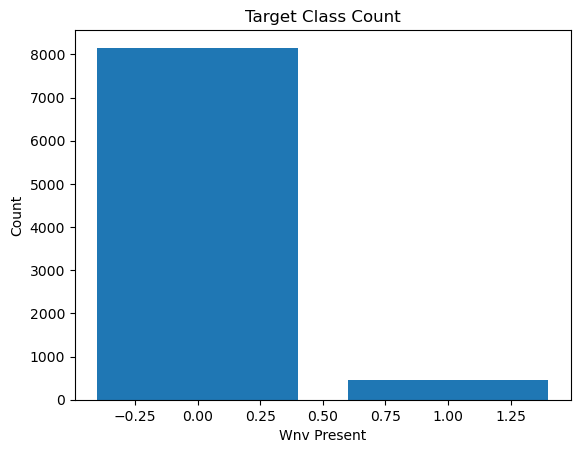

In [70]:
plt.bar(total_wnv_count['wnv_present'],
        total_wnv_count['count']
)
plt.title('Target Class Count')
plt.xlabel('Wnv Present')
plt.ylabel('Count')
plt.show()

This is an imbalanced dataset that requires for Oversampling Techniques (Eg. SMOTE). We will tackle it under the Modeling section.



### Correlation Matrix

In [71]:
num_df = train_merge_df.select_dtypes(exclude='object')
corr = round(num_df.corr(),2)
corr

,year,month,day,week,dayofweek,dayofyear,block,latitude,longitude,address_accuracy,wnv_present,num_mosquitos,station,stat_1_tmax,stat_1_tmin,...,rainlag4,humidlag1,humidlag2,humidlag3,humidlag4,mixed_tmax,mixed_tmin,mixed_precip_total,mixed_weekpreciptotal,mixed_weekavgtemp,mixed_r_humid,stat_2_tmax,stat_2_tmin,stat_2_tavg,stat_2_precip_total
year,1.00,-0.14,0.11,-0.13,0.35,-0.12,0.01,0.03,-0.06,0.02,0.04,-0.02,NaN,-0.07,-0.08,...,-0.02,0.02,0.02,0.06,-0.10,-0.07,-0.08,-0.08,0.01,0.09,-0.10,-0.06,-0.07,-0.07,-0.12
month,-0.14,1.00,-0.24,0.97,-0.13,0.97,0.01,-0.04,0.03,-0.03,0.10,-0.01,NaN,-0.01,-0.09,...,0.02,0.22,0.25,0.35,0.49,-0.01,-0.08,-0.17,-0.25,-0.56,-0.00,-0.01,-0.08,-0.04,-0.11
day,0.11,-0.24,1.00,0.01,0.15,0.02,-0.00,0.02,-0.02,-0.00,0.00,0.00,NaN,-0.02,0.12,...,-0.00,0.16,-0.05,0.01,0.18,-0.02,0.11,0.07,-0.01,0.04,0.21,-0.02,0.10,0.04,0.09
week,-0.13,0.97,0.01,1.00,-0.13,1.00,0.01,-0.03,0.03,-0.03,0.10,-0.01,NaN,-0.02,-0.07,...,0.03,0.28,0.25,0.36,0.56,-0.02,-0.06,-0.15,-0.27,-0.58,0.05,-0.02,-0.06,-0.04,-0.08
dayofweek,0.35,-0.13,0.15,-0.13,1.00,-0.09,0.03,0.01,-0.03,0.03,0.00,-0.02,NaN,-0.29,-0.21,...,0.00,-0.03,-0.08,-0.02,-0.11,-0.28,-0.20,0.01,0.11,0.08,0.08,-0.28,-0.19,-0.25,-0.05
dayofyear,-0.12,0.97,0.02,1.00,-0.09,1.00,0.01,-0.03,0.03,-0.03,0.10,-0.01,NaN,-0.02,-0.07,...,0.02,0.27,0.24,0.36,0.56,-0.02,-0.06,-0.16,-0.26,-0.57,0.05,-0.02,-0.05,-0.04,-0.09
block,0.01,0.01,-0.00,0.01,0.03,0.01,1.00,0.09,-0.18,0.18,0.01,-0.08,NaN,0.03,0.03,...,-0.02,-0.00,0.00,-0.00,0.01,0.03,0.03,0.00,-0.02,0.01,0.00,0.03,0.03,0.03,0.00
latitude,0.03,-0.04,0.02,-0.03,0.01,-0.03,0.09,1.00,-0.64,0.33,0.03,-0.06,NaN,-0.01,-0.03,...,0.00,0.01,-0.01,0.01,-0.01,-0.01,-0.03,0.02,-0.03,-0.01,0.03,-0.01,-0.03,-0.02,-0.00
longitude,-0.06,0.03,-0.02,0.03,-0.03,0.03,-0.18,-0.64,1.00,-0.37,-0.07,-0.00,NaN,0.04,0.05,...,0.01,-0.01,0.01,-0.02,0.02,0.04,0.05,-0.00,0.03,0.01,-0.02,0.04,0.05,0.05,0.01
address_accuracy,0.02,-0.03,-0.00,-0.03,0.03,-0.03,0.18,0.33,-0.37,1.00,0.01,-0.10,NaN,-0.01,-0.02,...,-0.01,-0.01,-0.00,-0.00,-0.03,-0.01,-0.02,0.02,-0.00,-0.00,0.02,-0.01,-0.03,-0.02,0.01


C:\Users\jinji\AppData\Local\Temp\ipykernel_16240\3189408834.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = train_merge_df.corr()[['wnv_present']].sort_values(ascending=False, by='wnv_present')


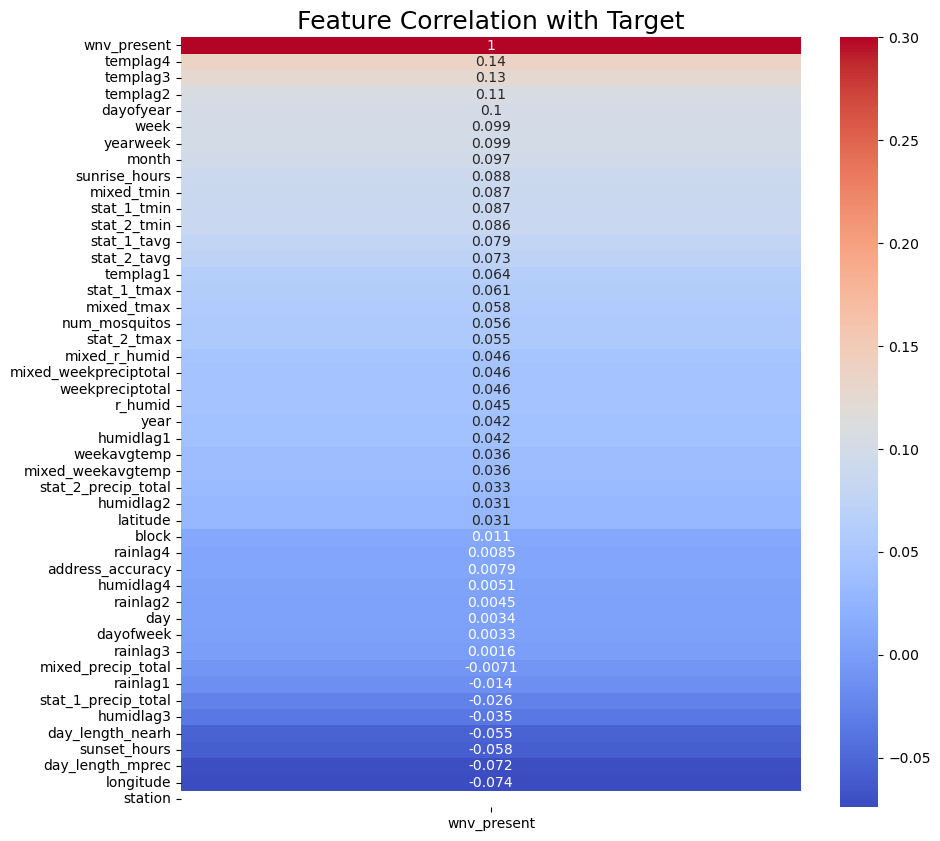

In [72]:
corr = train_merge_df.corr()[['wnv_present']].sort_values(ascending=False, by='wnv_present')
plt.figure(figsize=(10,10))
sns.heatmap(corr, cmap='coolwarm', annot=True, vmax=0.3)
plt.title('Feature Correlation with Target', fontsize=18);

### Trend on Number of Mosquitos 

In [73]:
px.defaults.template = 'seaborn'
px.line(train_df,
        x='date',
        y='num_mosquitos',
        labels={'date':'Year','num_mosquitos':'Number of Mosquitos Caught'},
        title='Number of Mosquitos caught over the years'
)

In [74]:
train_df.head()

,date,year,month,day,week,dayofweek,dayofyear,address,species,block,street,trap,address_number_and_street,latitude,longitude,address_accuracy,wnv_present,num_mosquitos
0,2007-05-29,2007,5,29,22,1,149,"1100 Roosevelt Road, Chicago, IL 60608, USA",CULEX PIPIENS/RESTUANS,11,W ROOSEVELT,T048,"1100 W ROOSEVELT, Chicago, IL",41.867108,-87.654224,8,0,1
1,2007-05-29,2007,5,29,22,1,149,"1100 Roosevelt Road, Chicago, IL 60608, USA",CULEX RESTUANS,11,W ROOSEVELT,T048,"1100 W ROOSEVELT, Chicago, IL",41.867108,-87.654224,8,0,2
2,2007-05-29,2007,5,29,22,1,149,"1100 South Peoria Street, Chicago, IL 60608, USA",CULEX RESTUANS,11,S PEORIA ST,T091,"1100 S PEORIA ST, Chicago, IL",41.862292,-87.648860,8,0,1
3,2007-05-29,2007,5,29,22,1,149,"1100 West Chicago Avenue, Chicago, IL 60642, USA",CULEX RESTUANS,11,W CHICAGO,T049,"1100 W CHICAGO, Chicago, IL",41.896282,-87.655232,8,0,1
4,2007-05-29,2007,5,29,22,1,149,"1500 North Long Avenue, Chicago, IL 60651, USA",CULEX RESTUANS,15,N LONG AVE,T153,"1500 N LONG AVE, Chicago, IL",41.907645,-87.760886,8,0,1


In [75]:
px.bar(train_df.groupby('year')['num_mosquitos'].sum().reset_index(),
       x='year',
       y='num_mosquitos',
       labels={'year':'Year','num_mosquitos':'Total Number of Mosquitos Caught'},
       title='Yearly Total Number of Mosquitos Caught'
)

In [76]:
px.bar(train_df.groupby('month')['num_mosquitos'].sum().reset_index(),
       x='month',
       y='num_mosquitos',
       labels={'month':'Month','num_mosquitos':'Total Number of Mosquitos Caught'},
       title='Total Number of Mosquitos Caught by Month'
)

In [77]:
px.bar(train_df.groupby('day')['num_mosquitos'].sum().reset_index(),
       x='day',
       y='num_mosquitos',
       labels={'day':'day','num_mosquitos':'Total Number of Mosquitos Caught'},
       title='Total Number of Mosquitos Caught by Day'
)

#### Trend on Wnv Occurrence

C:\Users\jinji\AppData\Local\Temp\ipykernel_16240\2238370983.py:6: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

C:\Users\jinji\AppData\Local\Temp\ipykernel_16240\2238370983.py:11: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

C:\Users\jinji\AppData\Local\Temp\ipykernel_16240\2238370983.py:16: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

C:\Users\jinji\AppData\Local\Temp\ipykernel_16240\2238370983.py:25: FutureWarning:


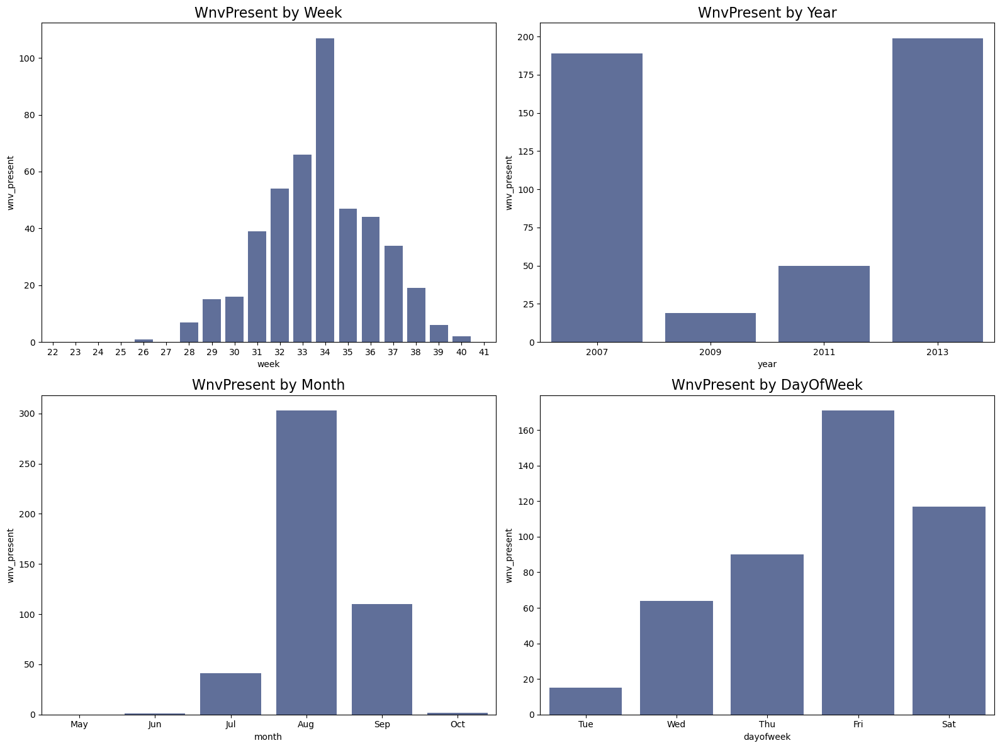

In [78]:
import calendar

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

# Group by 'Week'
group_df_week = train_df.groupby('week').sum().reset_index()
sns.barplot(data=group_df_week, x='week', y='wnv_present',  color = '#566BA2', ax=axes[0, 0])
axes[0, 0].set_title('WnvPresent by Week', fontsize=16)

# Group by 'Year' 
group_df_year = train_df.groupby('year').sum().reset_index()
sns.barplot(data=group_df_year, x='year', y='wnv_present',  color = '#566BA2', ax=axes[0, 1])
axes[0, 1].set_title('WnvPresent by Year', fontsize=16)

# Group by 'Month' 
group_df_month = train_df.groupby('month').sum().reset_index()
sns.barplot(data=group_df_month, x='month', y='wnv_present', color = '#566BA2', ax=axes[1, 0])
axes[1, 0].set_title('WnvPresent by Month', fontsize=16)

# Customize x-axis tick labels for 'Month'
month_labels = [calendar.month_abbr[month] for month in group_df_month['month']]
axes[1, 0].set_xticklabels(month_labels)

# Group by 'DayOfWeek'
group_df_dayofweek = train_df.groupby('dayofweek').sum().reset_index()
sns.barplot(data=group_df_dayofweek, x='dayofweek', y='wnv_present',  color = '#566BA2', ax=axes[1, 1])
axes[1, 1].set_title('WnvPresent by DayOfWeek', fontsize=16)

# Customize x-axis tick labels for 'DayOfWeek'
day_labels = ['Tue', 'Wed', 'Thu', 'Fri', 'Sat']
axes[1, 1].set_xticklabels(day_labels)

plt.tight_layout()
plt.show()

### Trend on Species

In [79]:
train_df['species'].value_counts()

CULEX PIPIENS/RESTUANS    3899
CULEX RESTUANS            2409
CULEX PIPIENS             1996
CULEX TERRITANS            216
CULEX SALINARIUS            83
CULEX TARSALIS               6
CULEX ERRATICUS              1
Name: species, dtype: int64

In [80]:
species_group = train_df.groupby('species')['num_mosquitos'].sum().reset_index()
species_group

,species,num_mosquitos
0,CULEX ERRATICUS,7
1,CULEX PIPIENS,44671
2,CULEX PIPIENS/RESTUANS,66268
3,CULEX RESTUANS,23431
4,CULEX SALINARIUS,145
5,CULEX TARSALIS,7
6,CULEX TERRITANS,510


In [81]:
px.bar(species_group,
       x='num_mosquitos',
       y='species',
       orientation='h',
       color='species',
       labels={'species':'Mosquito Species','num_mosquitos':'Total Number of Mosquitos Caught'},
       title='Number of Mosquitos Caught by Species'
)

In [82]:
# species_count = train_df.groupby('species').count().reset_index()
species_count = train_df.groupby('species').size().reset_index(name='count')
species_count

,species,count
0,CULEX ERRATICUS,1
1,CULEX PIPIENS,1996
2,CULEX PIPIENS/RESTUANS,3899
3,CULEX RESTUANS,2409
4,CULEX SALINARIUS,83
5,CULEX TARSALIS,6
6,CULEX TERRITANS,216


In [83]:
px.bar(species_count,
       x='count',
       y='species',
       orientation='h',
       color='species',
       labels={'species':'Mosquito Species','count':'Total Number of Affected Locations over 4 Years'},
       title='Total Number of Affected Area over 4 Years'
)

In [84]:
species_wnv = train_df.groupby('species')['wnv_present'].sum().reset_index()
species_wnv

,species,wnv_present
0,CULEX ERRATICUS,0
1,CULEX PIPIENS,184
2,CULEX PIPIENS/RESTUANS,225
3,CULEX RESTUANS,48
4,CULEX SALINARIUS,0
5,CULEX TARSALIS,0
6,CULEX TERRITANS,0


In [85]:
px.bar(species_wnv,
       x='wnv_present',
       y='species',
       orientation='h',
       color='species',
       labels={'species':'Mosquito Species','wnv_present':'Total Number of Presence West Nile Virus'},
       title='Number of West Nile Virus Present'
)

**Analysis of train data**

1. We only have datasets from May to Oct for year 2007, 2009, 2011 and 2013.
2. The number of mosquitos caught was approximately 50% lower in year 2009 and 2011.
3. The most number of mosquitos caught is in month August.

## 2) Merged Train Data (with Weather)

C:\Users\jinji\AppData\Local\Temp\ipykernel_16240\996788184.py:6: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



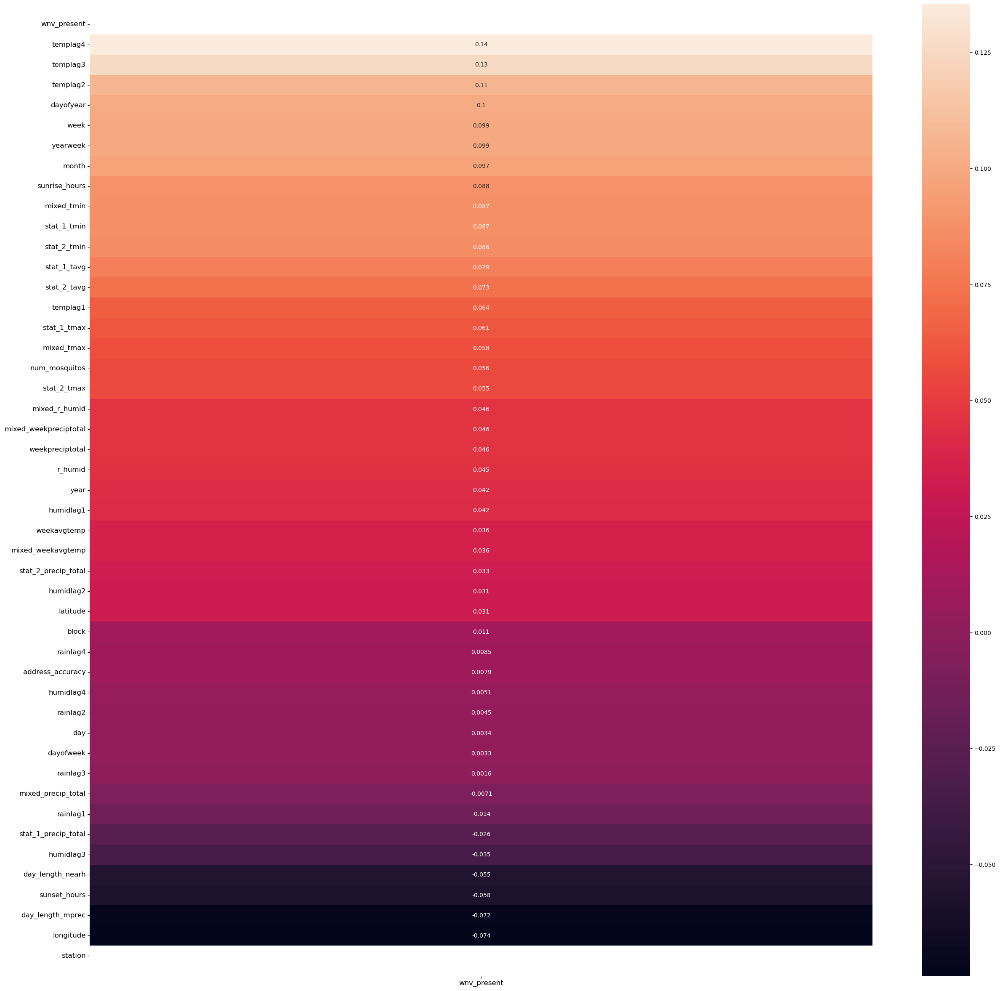

In [86]:
# Plot the heatmap for the numerical values

fix, ax = plt.subplots(figsize=(30,30))

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Plot the heatmap with seaborn.
ax = sns.heatmap(corr,mask=mask, ax=ax, annot=True)
ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=12)
ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=12, va="center")
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top -0.5)

plt.show()

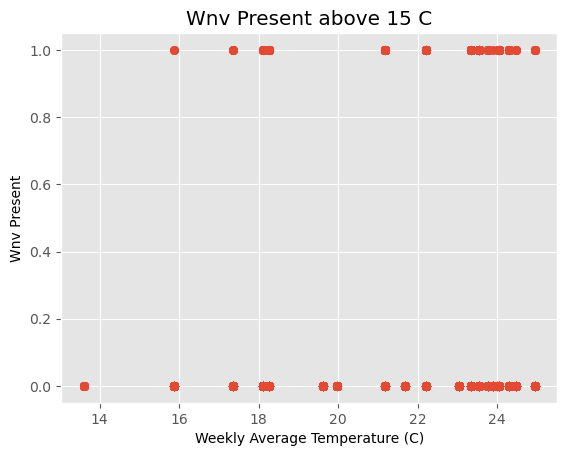

In [108]:
plt.scatter((train_merge_df['weekavgtemp']-32)*5/9, train_merge_df['wnv_present'])
# (32°F − 32) × 5/9
plt.xlabel('Weekly Average Temperature (C)')
plt.ylabel('Wnv Present')
plt.title('Wnv Present above 15 C')

plt.show()

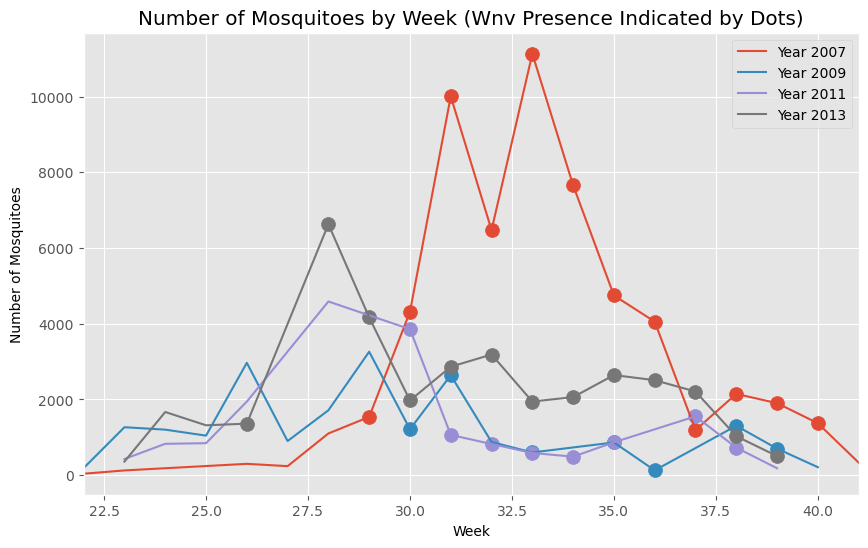

In [115]:
import matplotlib.pyplot as plt

# Group the data by 'year' and 'week', and calculate the sum of 'num_mosquitos'
grouped_df = train_merge_df.groupby(['year', 'week']).agg({'num_mosquitos': 'sum', 'wnv_present': 'max'}).reset_index()

# Set the figure size
plt.figure(figsize=(10, 6))

# Plot the number of mosquitoes against the week for each year
for year in grouped_df['year'].unique():
    year_data = grouped_df[grouped_df['year'] == year]
    line_color = plt.plot(year_data['week'], year_data['num_mosquitos'], label=f'Year {year}')[0].get_color()

    # Plot a circle at data points where wnv_present is 1
    wnv_present_data = year_data[year_data['wnv_present'] == 1]
    plt.scatter(wnv_present_data['week'], wnv_present_data['num_mosquitos'], color=line_color, s=100)

# Set the labels and title
plt.xlabel('Week')
plt.ylabel('Number of Mosquitoes')
plt.title('Number of Mosquitoes by Week (Wnv Presence Indicated by Dots)')

# Set the x-axis range based on the available data
week_min = grouped_df['week'].min()
week_max = grouped_df['week'].max()
plt.xlim(week_min, week_max)

# Add a legend
plt.legend()

# Show the plot
plt.show()


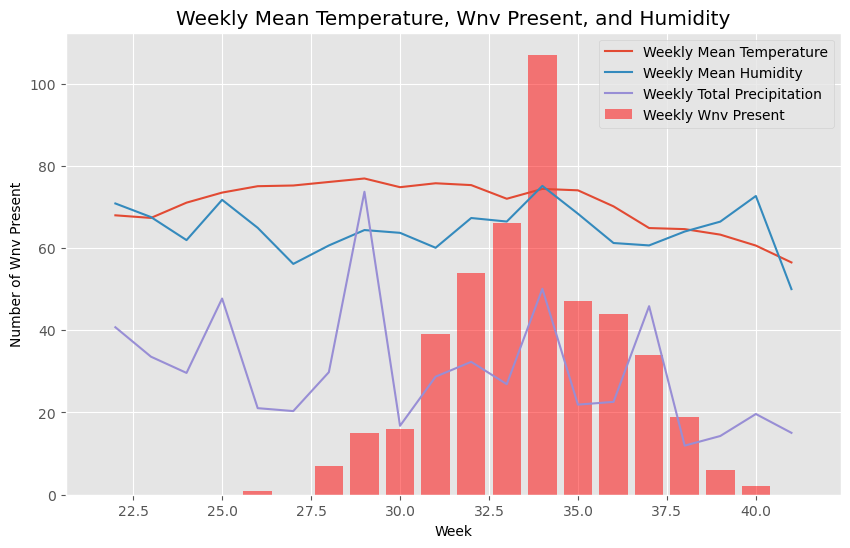

In [130]:
# Group the data by 'week' and calculate the mean temperature, count of wnv_present, and mean humidity
grouped_df = train_merge_df.groupby('week').agg({'weekavgtemp': 'mean', 'wnv_present': 'sum', 'r_humid': 'mean', 'weekpreciptotal': 'mean'}).reset_index()

# Set the figure size
plt.figure(figsize=(10, 6))

# Plot the weekly mean temperature
plt.plot(grouped_df['week'], grouped_df['weekavgtemp'], label='Weekly Mean Temperature')

# Plot the weekly number of wnv_present as a bar plot
plt.bar(grouped_df['week'], grouped_df['wnv_present'], color='red', alpha=0.5, label='Weekly Wnv Present')

# Plot the weekly mean humidity as a line plot
plt.plot(grouped_df['week'], grouped_df['r_humid'], label='Weekly Mean Humidity')

# Plot the weekly mean humidity as a line plot
plt.plot(grouped_df['week'], (grouped_df['weekpreciptotal'])*2, label='Weekly Total Precipitation')

# Set the labels and title
plt.xlabel('Week')
plt.ylabel('Number of Wnv Present')
plt.title('Weekly Mean Temperature, Wnv Present, and Humidity')

# Add a legend
plt.legend()

# Show the plot
plt.show()


## 3) Spray Data

In [88]:
spray_df = pd.read_csv('../assets/spray.csv')

In [89]:
spray_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14835 entries, 0 to 14834
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       14835 non-null  object 
 1   Time       14251 non-null  object 
 2   Latitude   14835 non-null  float64
 3   Longitude  14835 non-null  float64
dtypes: float64(2), object(2)
memory usage: 463.7+ KB


In [90]:
spray_df['Date']

0        2011-08-29
1        2011-08-29
2        2011-08-29
3        2011-08-29
4        2011-08-29
            ...    
14830    2013-09-05
14831    2013-09-05
14832    2013-09-05
14833    2013-09-05
14834    2013-09-05
Name: Date, Length: 14835, dtype: object

In [91]:
spray_df['Year'] = pd.to_datetime(spray_df['Date']).apply(lambda x: x.year)
spray_df['Week'] = pd.to_datetime(spray_df['Date']).apply(lambda x: x.week)

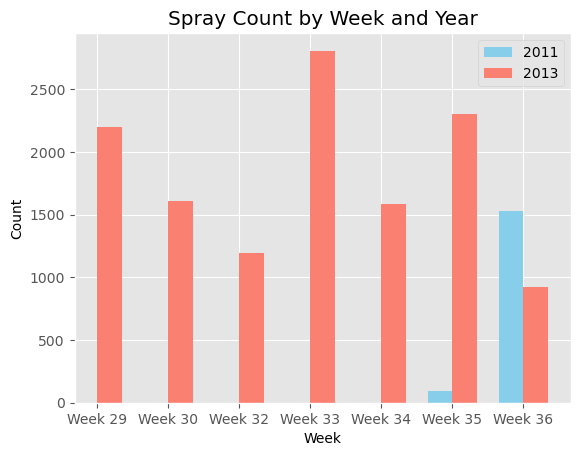

In [92]:
plt.style.use('ggplot')

# Pivot the spray_df to reshape the data
pivot_df = spray_df.pivot_table(index='Week', columns='Year', values='Time', aggfunc='count')

# Get the unique weeks
unique_weeks = pivot_df.index

bar_width = 0.35

# Set the positions of the bars on the x-axis
r1 = range(len(unique_weeks))
r2 = [x + bar_width for x in r1]

plt.bar(r1, pivot_df[2011], color='skyblue', width=bar_width, label='2011')
plt.bar(r2, pivot_df[2013], color='salmon', width=bar_width, label='2013')

plt.xlabel('Week')
plt.ylabel('Count')
plt.title('Spray Count by Week and Year')

# Set the x-axis tick positions and labels
plt.xticks([r + bar_width / 2 for r in range(len(unique_weeks))],
           [f'Week {week}' for week in unique_weeks])

plt.legend()
plt.show()


In [93]:
def plot_mos_spray(year, bar=False):
    # Get unique week values from 'Week' column in spray_df
    unique_weeks = sorted(spray_df[spray_df['Year'] == year]['Week'].unique())

    # Count the number of rows for each unique 'Week' in spray_df
    spray_counts = spray_df[spray_df['Year'] == year].groupby('Week').size()

    # Group by 'Week' and calculate the sum of 'NumMosquitos' and 'WnvPresent'
    grouped_df = train_merge_df[train_merge_df['year'] == year].groupby('week').agg({'num_mosquitos': 'sum', 'wnv_present': 'sum'}).reset_index()

    fig, ax1 = plt.subplots(figsize=(12, 6))  # Specify the figure size here

    # Create a second y-axis for 'NumMosquitos'
    ax2 = ax1.twinx()

    # Plot the sum of 'NumMosquitos'
    ax1.plot(grouped_df['week'], grouped_df['num_mosquitos'], color='blue', label='NumMosquitos')
    ax1.set_xlabel('Week')
    ax1.set_ylabel('WnvPresent')
    ax1.yaxis.tick_left()  # Set y-axis ticks on the left
    ax1.yaxis.set_label_position('left')  # Set y-axis label on the left
    ax1.legend(loc='upper left')

    # Plot the sum of 'WnvPresent'
    ax2.plot(grouped_df['week'], grouped_df['wnv_present'], color='green', label='WnvPresent')
    ax2.set_ylabel('NumMosquitos')
    ax2.yaxis.tick_right()  # Set y-axis ticks on the right
    ax2.yaxis.set_label_position('right')  # Set y-axis label on the right
    ax2.legend(loc='upper right')

    ax1.set_title(f'Mosquitoes and WnvPresent in {year}, with Spray Data')

    if bar == True:
        # Create a third y-axis for 'Spray Counts'
        ax3 = ax2.twinx()
        bars = ax3.bar(spray_counts.index, spray_counts.values, color='crimson', alpha=0.3, label='Spray Counts')
        # ax3.set_ylabel('')
        # ax3.yaxis.tick_right()  # Set y-axis ticks on the right
        # ax3.yaxis.set_label_position('right')  # Set y-axis label on the right
        ax1.set_yticks([])
        ax3.legend(loc='upper center')
        ax3.grid(False)  # Remove grid lines

        for bar in bars:
            height = bar.get_height()
            ax3.text(bar.get_x() + bar.get_width() / 2, height, height, ha='center', va='bottom')

    else:
        # Draw vertical dotted lines at unique week values
        for week in unique_weeks:
            ax1.axvline(x=week, color='crimson', linestyle='dotted')
            ax2.axvline(x=week, color='crimson', linestyle='dotted')

    plt.show()


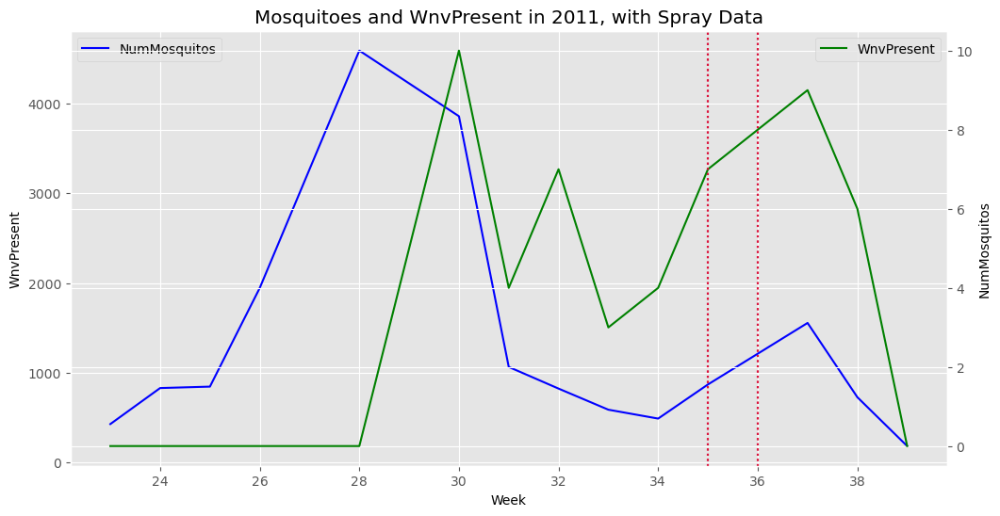

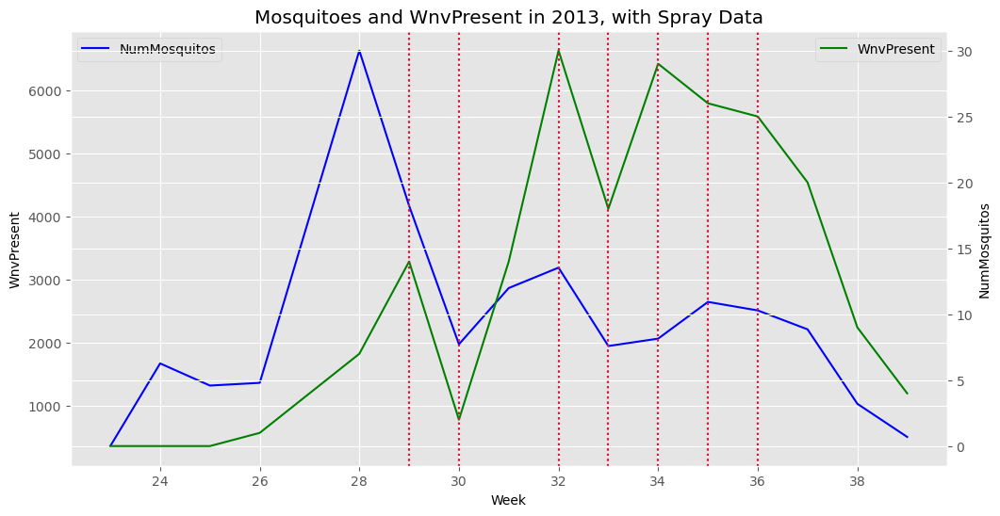

In [99]:
# Change bar to False, to see dotted line instead
plot_mos_spray(2011, bar=False)
plot_mos_spray(2013, bar=False)

In [95]:
import folium

# Map centered around the mean Latitude and Longitude values
map_center = [spray_df['Latitude'].mean(), spray_df['Longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=10)

for index, row in spray_df.iterrows():
    latitude = row['Latitude']
    longitude = row['Longitude']
    
    # Create a circle marker for each data point
    folium.CircleMarker(
        location=[latitude, longitude],
        radius=5,  
        color='blue', 
        fill=True,
        fill_color='blue'  
    ).add_to(m)

# Show WnvPresent points on the map if there are Wnv detected
positive_wnv_df = train_merge_df[train_merge_df['wnv_present'] > 0]

# Varying size based on Wnv Count
for index, row in positive_wnv_df.iterrows():
    lat = row['latitude']
    lon = row['longitude']
    wnv_present = row['wnv_present']
    radius = wnv_present * 5  # Scaling factor 
    folium.CircleMarker(location=[lat, lon], radius=radius, color='red', fill=True, fill_color='red').add_to(m)

m

Red: Locations with Wnv detected

Blue: Trap locations

#### Map Dataset

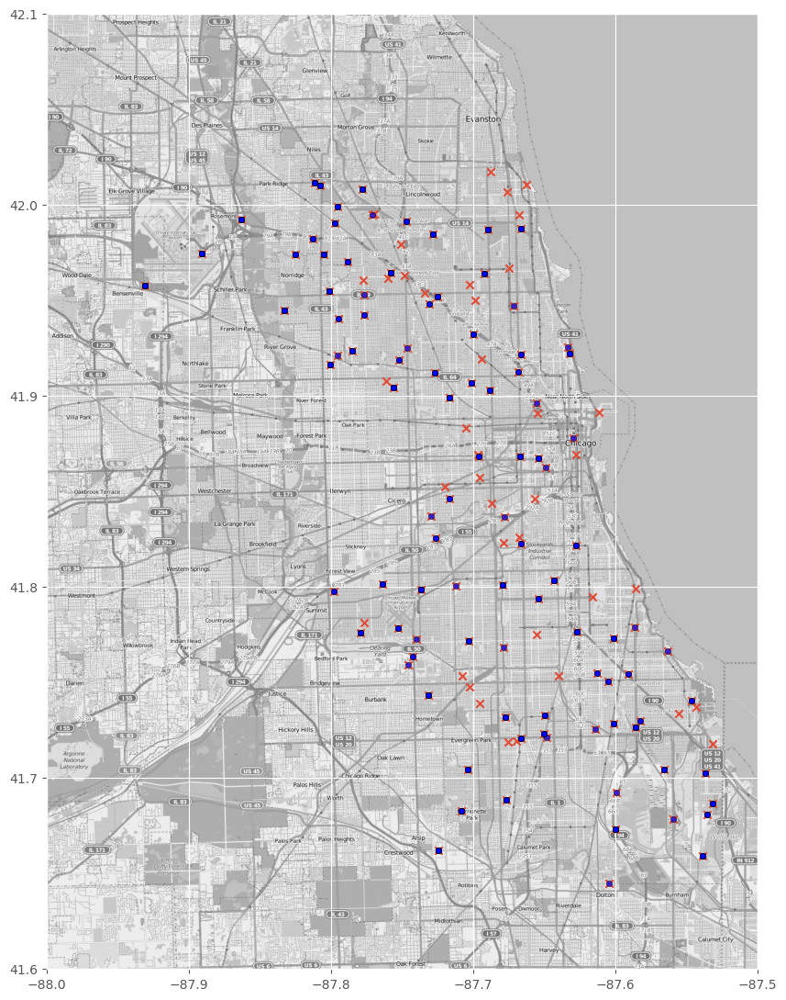

In [96]:
mapdata = np.loadtxt("../assets/mapdata_copyright_openstreetmap_contributors.txt")
traps = train_merge_df[['trap','longitude', 'latitude', 'wnv_present']]

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps[['longitude', 'latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x')

for index, row in traps.iterrows():
    lon = row['longitude']
    lat = row['latitude']
    wnv_present = row['wnv_present']
    if wnv_present > 0:
        circle_size = wnv_present * 20
        circle_color = 'blue'
        circle_border_color = 'black'
        circle_alpha = 0.7
        plt.scatter(lon, lat, s=circle_size, color=circle_color, edgecolors=circle_border_color, alpha=circle_alpha)

plt.show()

## Modeling

In [97]:
# define constants for modelling
RS = 42 # random state
CV = 5 # cross val
SCORE = 'roc_auc' # scoring 

In [98]:
train_merge_df.columns

Index(['year', 'month', 'day', 'week', 'dayofweek', 'dayofyear', 'address',
       'species', 'block', 'street', 'trap', 'address_number_and_street',
       'latitude', 'longitude', 'address_accuracy', 'wnv_present',
       'num_mosquitos', 'station', 'stat_1_tmax', 'stat_1_tmin', 'stat_1_tavg',
       'stat_1_precip_total', 'day_length_mprec', 'day_length_nearh',
       'sunrise_hours', 'sunset_hours', 'yearweek', 'weekpreciptotal',
       'weekavgtemp', 'r_humid', 'templag1', 'templag2', 'templag3',
       'templag4', 'rainlag1', 'rainlag2', 'rainlag3', 'rainlag4', 'humidlag1',
       'humidlag2', 'humidlag3', 'humidlag4', 'mixed_tmax', 'mixed_tmin',
       'mixed_precip_total', 'mixed_weekpreciptotal', 'mixed_weekavgtemp',
       'mixed_r_humid', 'stat_2_tmax', 'stat_2_tmin', 'stat_2_tavg',
       'stat_2_precip_total'],
      dtype='object')

In [98]:
# Categorical and numerical feature selection for X

cat_list = ['species', 'street', 'trap']
num_list = [
    'block', 'latitude', 'longitude',
    'year', 'month', 'day', 'stat_1_tmax', 'stat_1_tmin', 'stat_1_tavg',
    'stat_1_precip_total', 'day_length_mprec', 'day_length_nearh',
    'sunrise_hours', 'sunset_hours', 'mixed_tmax', 'mixed_tmin',
    'mixed_precip_total', 'stat_2_tmax', 'stat_2_tmin', 'stat_2_tavg', 'stat_2_precip_total'
]

# num_list = [
#     'block', 'latitude', 'longitude',
#     # 'year', 
#     'month', 'day', 'stat_1_tmax', 'stat_1_tmin', 'stat_1_tavg',
#     'stat_1_precip_total', 'day_length_mprec', 'day_length_nearh',
#     'sunrise_hours', 'sunset_hours', 'mixed_tmax', 'mixed_tmin',
#     'mixed_precip_total', 'stat_2_tmax', 'stat_2_tmin', 'stat_2_tavg', 'stat_2_precip_total',
    
#     'week', 'mixed_r_humid',
#        'mixed_templag1', 'mixed_templag2', 'mixed_templag3', 'mixed_templag4',
#        'mixed_rainlag1', 'mixed_rainlag2', 'mixed_rainlag3', 'mixed_rainlag4',
#        'mixed_humidlag1', 'mixed_humidlag2', 'mixed_humidlag3',
#        'mixed_humidlag4'
# ]

# num_list = [
# 'templag2', 'templag3', 'templag4','dayofyear', 'week', 'month', 'yearweek',
#        'sunrise_hours', 'mixed_tmin', 'stat_1_tmin', 'stat_1_tavg', 'stat_2_tmin', 'stat_2_tavg', 'templag1'
# , 'stat_1_tmax', 'mixed_tmax',
#        'mixed_r_humid', 'stat_2_tmax', 'mixed_weekpreciptotal', 'weekpreciptotal', 'r_humid', 'year', 'humidlag1',
#        'weekavgtemp', 'mixed_weekavgtemp',
#        'stat_2_precip_total',
#        'humidlag2',
#        'latitude'

# #  'day', 'dayofweek', , 'address',
# #        'species', 'block', 'street', 'trap', 'address_number_and_street', 'longitude', 'address_accuracy', 'wnv_present',
# #        'num_mosquitos', 'station',
# #        'stat_1_precip_total', 'day_length_mprec', 'day_length_nearh', 'sunset_hours',  'rainlag1', 'rainlag2', 'rainlag3', 'rainlag4', 'humidlag3', 'humidlag4',
# #        'mixed_precip_total'
# ]

display(cat_list)
display(num_list)

['species', 'street', 'trap']

['block',
 'latitude',
 'longitude',
 'year',
 'month',
 'day',
 'stat_1_tmax',
 'stat_1_tmin',
 'stat_1_tavg',
 'stat_1_precip_total',
 'day_length_mprec',
 'day_length_nearh',
 'sunrise_hours',
 'sunset_hours',
 'mixed_tmax',
 'mixed_tmin',
 'mixed_precip_total',
 'stat_2_tmax',
 'stat_2_tmin',
 'stat_2_tavg',
 'stat_2_precip_total']

In [99]:
# preparing the features for modelling
X = train_merge_df[num_list + cat_list]
y = train_merge_df['wnv_present']

In [100]:
# Splitting data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RS, stratify=y)

In [101]:
# Create a transformer for One Hot Encoding
ohe_trf = ColumnTransformer([
    ("enc", OneHotEncoder(sparse_output=False, handle_unknown='ignore'), cat_list)
], remainder = "passthrough")

In [102]:
# Define a function that returns the model scores after running grid Search CV
def get_model_score (tag, X_tr, X_ts, y_tr, y_ts, pipe, params):

    # Instantiate the GridSearchCV model
    gs = GridSearchCV(estimator = pipe,
                      param_grid = params,
                      scoring = SCORE,
                      cv = CV,
                      verbose=2
    )
    
    # Fit the model & make prediction
    gs.fit(X_tr, y_tr)
    bm = gs.best_estimator_
    y_pred = bm.predict(X_ts)
    
    # Save confusion matrix values
    tn, fp, fn, tp = confusion_matrix(y_ts, y_pred).ravel()
    spec = tn / (tn + fp)
    
    # Print the metrics score for the model
    print('-------------------------------------------------------\n')
    print(tag)
    print()
    print('-------------------------------------------------------\n')
    print(f'Best params: {gs.best_params_}')
    print(classification_report(y_ts, y_pred))
    print(f'Train Accuracy Score: {bm.score(X_tr, y_tr):,.4f}')
    print(f'Test Accuracy Score: {bm.score(X_ts, y_ts):,.4f}')
    print(f'Sensitivity(TPR): {recall_score(y_ts, y_pred):,.4f}')
    print(f'Specificity(TNR): {spec:,.4f}')
    print(f'Precision: {precision_score(y_ts, y_pred):,.4f}')
    print(f'F1-Score: {f1_score(y_ts, y_pred):,.4f}')
    print(f'Train ROC Score: {roc_auc_score(y_tr, bm.predict_proba(X_tr)[:,1]):,.4f}')
    print(f'Test ROC Score: {roc_auc_score(y_ts, bm.predict_proba(X_ts)[:,1]):,.4f}')
    print(f'Train Cross-val-score(cv=5): {cross_val_score(bm, X_tr, y_tr, cv=CV).mean():,.4f}')
    print(f'Test Cross-val-score(cv=5): {cross_val_score(bm, X_ts, y_ts, cv=CV).mean():,.4f}')
    print('-------------------------------------------------------\n')
    
    # plot roc and confusion matrix
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,5))
    fpr, tpr, thresholds = roc_curve(y_ts, y_pred)
    roc_auc = auc(fpr, tpr)
    RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=tag).plot(ax=ax[0])
    
    # Plot baseline. (Perfect overlap between the two populations.)
    ax[0].plot(np.linspace(0, 1, 200), 
               np.linspace(0, 1, 200),
               label='baseline', 
               linestyle='--'
    )
    cm = confusion_matrix(y_ts, y_pred, labels=bm.classes_)
    ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=bm.classes_).plot(cmap='RdPu', ax=ax[1]);
    ax[0].set_title(f'ROC for {tag}');
    ax[1].set_title(f'Confusion Matrix for {tag}');
    
    return bm

### Logistic Regression

In [103]:
# Create a pipeline for all transformer & model
lr_pipe = Pipeline([
    ('ohe', ohe_trf),
    ('smote', SMOTE(random_state=RS)),
    ('ss', StandardScaler()),
    ('lr', LogisticRegression(random_state=RS, max_iter=5000))
])

lr_params = {
    'lr__C': np.linspace(0.1, 1, 20),
    'smote__k_neighbors': [3, 5, 7, 9]
}

Fitting 5 folds for each of 80 candidates, totalling 400 fits
[CV] END ....................lr__C=0.1, smote__k_neighbors=3; total time=   1.2s
[CV] END ....................lr__C=0.1, smote__k_neighbors=3; total time=   1.0s
[CV] END ....................lr__C=0.1, smote__k_neighbors=3; total time=   1.3s
[CV] END ....................lr__C=0.1, smote__k_neighbors=3; total time=   0.6s
[CV] END ....................lr__C=0.1, smote__k_neighbors=3; total time=   0.7s
[CV] END ....................lr__C=0.1, smote__k_neighbors=5; total time=   0.7s
[CV] END ....................lr__C=0.1, smote__k_neighbors=5; total time=   0.7s
[CV] END ....................lr__C=0.1, smote__k_neighbors=5; total time=   0.8s
[CV] END ....................lr__C=0.1, smote__k_neighbors=5; total time=   0.8s
[CV] END ....................lr__C=0.1, smote__k_neighbors=5; total time=   0.8s
[CV] END ....................lr__C=0.1, smote__k_neighbors=7; total time=   0.8s
[CV] END ....................lr__C=0.1, smote__

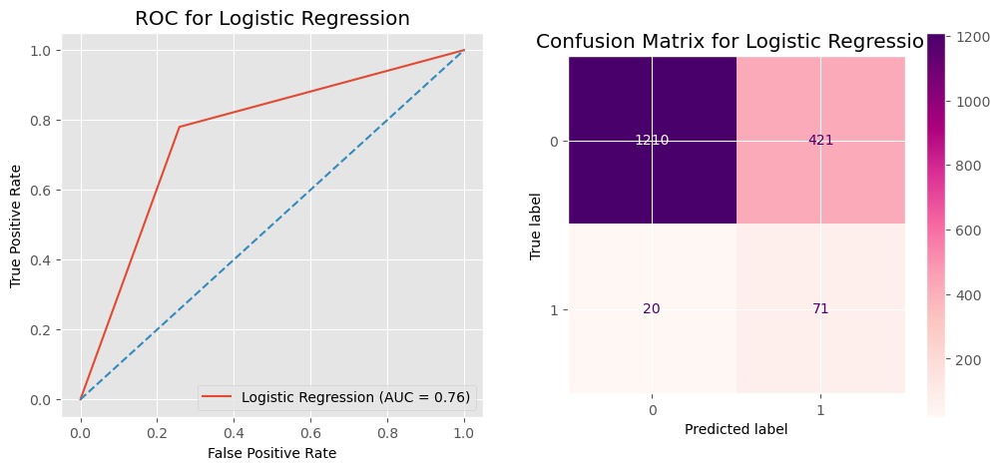

In [104]:
lr_model = get_model_score('Logistic Regression', X_train, X_test, y_train, y_test, lr_pipe, lr_params)

Top 20 features for Logistic Regression Model.

In [105]:
# Create a df with feature importance for the model
lr_coef_df = pd.DataFrame(list(zip( lr_model.feature_names_in_, lr_model['lr'].coef_[0,:].tolist())),
    columns=['features', 'coefficient']
)

lr_coef_df.sort_values(by='coefficient', ascending=False).reset_index(drop=True).head(20)

,features,coefficient
0,latitude,0.278505
1,longitude,0.199772
2,day_length_mprec,0.111183
3,sunrise_hours,0.073370
4,stat_1_tavg,0.049634
5,mixed_tmin,0.035443
6,day_length_nearh,0.034239
7,species,0.032079
8,stat_2_precip_total,0.029015
9,mixed_precip_total,0.026706


### Random Forest Classifier

In [106]:
# Create a pipeline for all transformer & model
rf_pipe = Pipeline([
    ('ohe', ohe_trf),
    ('smote', SMOTE(random_state=RS)),
    ('ss', StandardScaler()),
    ('rf', RandomForestClassifier(random_state = RS))
])

rf_params = {
    'rf__n_estimators': [50, 100, 200, 250, 300],
    'rf__max_depth': [5, 6],
    'smote__k_neighbors': [3, 5, 7, 9]
}

Fitting 5 folds for each of 40 candidates, totalling 200 fits
[CV] END rf__max_depth=5, rf__n_estimators=50, smote__k_neighbors=3; total time=   1.6s
[CV] END rf__max_depth=5, rf__n_estimators=50, smote__k_neighbors=3; total time=   1.5s
[CV] END rf__max_depth=5, rf__n_estimators=50, smote__k_neighbors=3; total time=   1.5s
[CV] END rf__max_depth=5, rf__n_estimators=50, smote__k_neighbors=3; total time=   1.5s
[CV] END rf__max_depth=5, rf__n_estimators=50, smote__k_neighbors=3; total time=   1.4s
[CV] END rf__max_depth=5, rf__n_estimators=50, smote__k_neighbors=5; total time=   1.3s
[CV] END rf__max_depth=5, rf__n_estimators=50, smote__k_neighbors=5; total time=   1.4s
[CV] END rf__max_depth=5, rf__n_estimators=50, smote__k_neighbors=5; total time=   1.4s
[CV] END rf__max_depth=5, rf__n_estimators=50, smote__k_neighbors=5; total time=   1.5s
[CV] END rf__max_depth=5, rf__n_estimators=50, smote__k_neighbors=5; total time=   1.6s
[CV] END rf__max_depth=5, rf__n_estimators=50, smote__k_ne

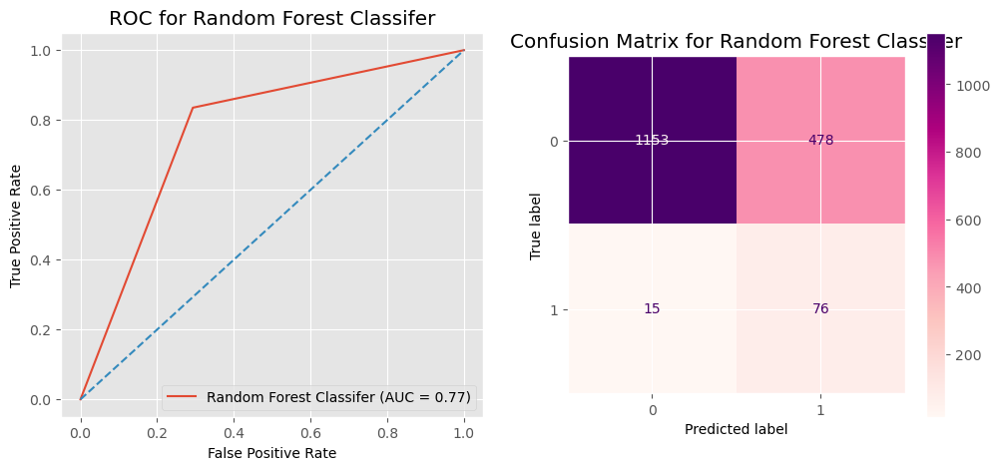

In [107]:
rf_model = get_model_score('Random Forest Classifer', X_train, X_test, y_train, y_test, rf_pipe, rf_params)

Top 20 features for Random Forest Classifier Model.

In [108]:
# Create a df with feature importance for the model
rf_coef_df = pd.DataFrame(list(zip( rf_model.feature_names_in_, rf_model['rf'].feature_importances_.tolist())),
    columns=['features', 'coefficient']
)

rf_coef_df.sort_values(by='coefficient', ascending=False).reset_index(drop=True).head(20)

,features,coefficient
0,latitude,6.626708e-02
1,year,5.746714e-02
2,longitude,5.353039e-02
3,stat_1_tmax,3.314209e-03
4,mixed_tmax,7.313682e-04
5,stat_1_tmin,4.914850e-04
6,day_length_mprec,3.810214e-04
7,sunrise_hours,3.747388e-04
8,stat_1_tavg,1.418150e-04
9,day_length_nearh,1.396415e-04


### XGBoost Classifier

In [109]:
# Create a pipeline for all transformer & model
xgb_pipe = Pipeline([
    ('ohe', ohe_trf),
    ('smote', SMOTE(random_state=RS)),
    ('ss', StandardScaler()),
    ('xgb', XGBClassifier(random_state = RS))
])

xgb_params = {
    'xgb__max_depth': range (2, 6, 1),
    'xgb__n_estimators': range(50, 300, 50),
    'xgb__learning_rate': [0.01, 0.05, 0.1],
    'smote__k_neighbors': [3, 5, 7, 9]
}

Fitting 5 folds for each of 240 candidates, totalling 1200 fits
[CV] END smote__k_neighbors=3, xgb__learning_rate=0.01, xgb__max_depth=2, xgb__n_estimators=50; total time=   1.7s
[CV] END smote__k_neighbors=3, xgb__learning_rate=0.01, xgb__max_depth=2, xgb__n_estimators=50; total time=   1.8s
[CV] END smote__k_neighbors=3, xgb__learning_rate=0.01, xgb__max_depth=2, xgb__n_estimators=50; total time=   1.4s
[CV] END smote__k_neighbors=3, xgb__learning_rate=0.01, xgb__max_depth=2, xgb__n_estimators=50; total time=   1.9s
[CV] END smote__k_neighbors=3, xgb__learning_rate=0.01, xgb__max_depth=2, xgb__n_estimators=50; total time=   1.5s
[CV] END smote__k_neighbors=3, xgb__learning_rate=0.01, xgb__max_depth=2, xgb__n_estimators=100; total time=   2.9s
[CV] END smote__k_neighbors=3, xgb__learning_rate=0.01, xgb__max_depth=2, xgb__n_estimators=100; total time=   2.8s
[CV] END smote__k_neighbors=3, xgb__learning_rate=0.01, xgb__max_depth=2, xgb__n_estimators=100; total time=   2.7s
[CV] END smot

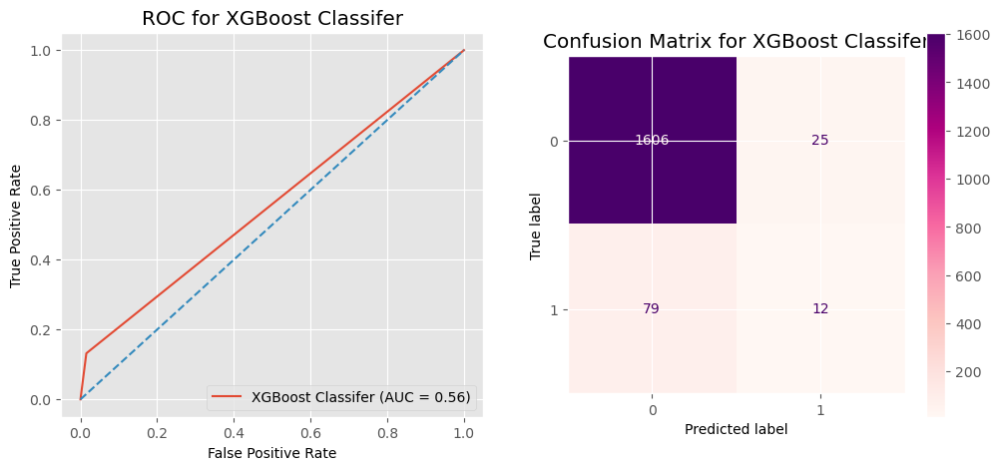

In [110]:
xgb_model = get_model_score('XGBoost Classifer', X_train, X_test, y_train, y_test, xgb_pipe, xgb_params)

Top 20 features for XGBoost Classifier Model.

In [111]:
# Create a df with feature importance for the model
xgb_coef_df = pd.DataFrame(list(zip( xgb_model.feature_names_in_, xgb_model['xgb'].feature_importances_.tolist())),
    columns=['features', 'coefficient']
)

xgb_coef_df.sort_values(by='coefficient', ascending=False).reset_index(drop=True).head(20)

,features,coefficient
0,latitude,0.111310
1,longitude,0.045443
2,stat_1_tmin,0.009926
3,sunrise_hours,0.007921
4,stat_1_tavg,0.007412
5,mixed_precip_total,0.006477
6,mixed_tmax,0.005959
7,trap,0.005222
8,year,0.004585
9,stat_2_tmin,0.004343


### AdaBoost Classifier

In [112]:
# Create a pipeline for all transformer & model
ada_pipe = Pipeline([
    ('ohe', ohe_trf),
    ('smote', SMOTE(random_state=RS)),
    ('ss', StandardScaler()),
    ('ada', AdaBoostClassifier(random_state = RS))
])

ada_params = {
    'ada__n_estimators': [50, 100, 200, 250, 300],
    'ada__learning_rate': [0.01, 0.05, 0.1],
    'smote__k_neighbors': [3, 5, 7, 9]
}

Fitting 5 folds for each of 60 candidates, totalling 300 fits
[CV] END ada__learning_rate=0.01, ada__n_estimators=50, smote__k_neighbors=3; total time=   4.1s
[CV] END ada__learning_rate=0.01, ada__n_estimators=50, smote__k_neighbors=3; total time=   4.1s
[CV] END ada__learning_rate=0.01, ada__n_estimators=50, smote__k_neighbors=3; total time=   4.2s
[CV] END ada__learning_rate=0.01, ada__n_estimators=50, smote__k_neighbors=3; total time=   4.0s
[CV] END ada__learning_rate=0.01, ada__n_estimators=50, smote__k_neighbors=3; total time=   3.9s
[CV] END ada__learning_rate=0.01, ada__n_estimators=50, smote__k_neighbors=5; total time=   4.2s
[CV] END ada__learning_rate=0.01, ada__n_estimators=50, smote__k_neighbors=5; total time=   4.3s
[CV] END ada__learning_rate=0.01, ada__n_estimators=50, smote__k_neighbors=5; total time=   4.0s
[CV] END ada__learning_rate=0.01, ada__n_estimators=50, smote__k_neighbors=5; total time=   4.3s
[CV] END ada__learning_rate=0.01, ada__n_estimators=50, smote__k_

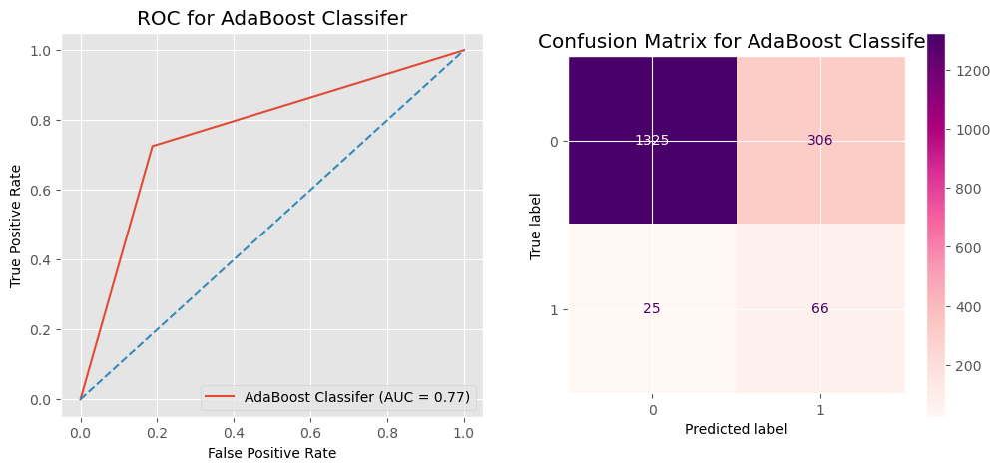

In [113]:
ada_model = get_model_score('AdaBoost Classifer', X_train, X_test, y_train, y_test, ada_pipe, ada_params)

Top 20 features for AdaBoost Classifier Model.

In [114]:
# Create a df with feature importance for the model
ada_coef_df = pd.DataFrame(list(zip( ada_model.feature_names_in_, ada_model['ada'].feature_importances_.tolist())),
    columns=['features', 'coefficient']
)

ada_coef_df.sort_values(by='coefficient', ascending=False).reset_index(drop=True).head(20)

,features,coefficient
0,longitude,0.426667
1,latitude,0.123333
2,year,0.023333
3,block,0.000000
4,mixed_tmax,0.000000
5,street,0.000000
6,species,0.000000
7,stat_2_precip_total,0.000000
8,stat_2_tavg,0.000000
9,stat_2_tmin,0.000000


### Voting Classifier

In [115]:
# Define the Voting Classifier
vclf = VotingClassifier(estimators=[ 
        ('lr', LogisticRegression(random_state = RS, max_iter=5000, C=1.0)), 
        ('rf', RandomForestClassifier(random_state=RS, max_depth=6, n_estimators=250)),
        ('xgb', XGBClassifier(random_state = RS, learning_rate=0.1, max_depth=5, n_estimators=200)),
        ('ada', AdaBoostClassifier(random_state = RS, learning_rate=0.05, n_estimators=300))
], voting='soft', weights=[2,1,1,2])

# Create a pipeline for all transformer & model
vc_pipe = Pipeline([
    ('ohe', ohe_trf),
    ('smote', SMOTE(random_state=RS)),
    ('ss', StandardScaler()),
    ('vc', vclf)
])

vc_params = {
    'smote__k_neighbors': [3, 5, 7, 9]
}

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] END ...............................smote__k_neighbors=3; total time=  29.6s
[CV] END ...............................smote__k_neighbors=3; total time=  29.4s
[CV] END ...............................smote__k_neighbors=3; total time=  29.4s
[CV] END ...............................smote__k_neighbors=3; total time=  29.7s
[CV] END ...............................smote__k_neighbors=3; total time=  29.5s
[CV] END ...............................smote__k_neighbors=5; total time=  30.1s
[CV] END ...............................smote__k_neighbors=5; total time=  30.3s
[CV] END ...............................smote__k_neighbors=5; total time=  30.3s
[CV] END ...............................smote__k_neighbors=5; total time=  30.3s
[CV] END ...............................smote__k_neighbors=5; total time=  30.0s
[CV] END ...............................smote__k_neighbors=7; total time=  30.9s
[CV] END ...............................smote__k_

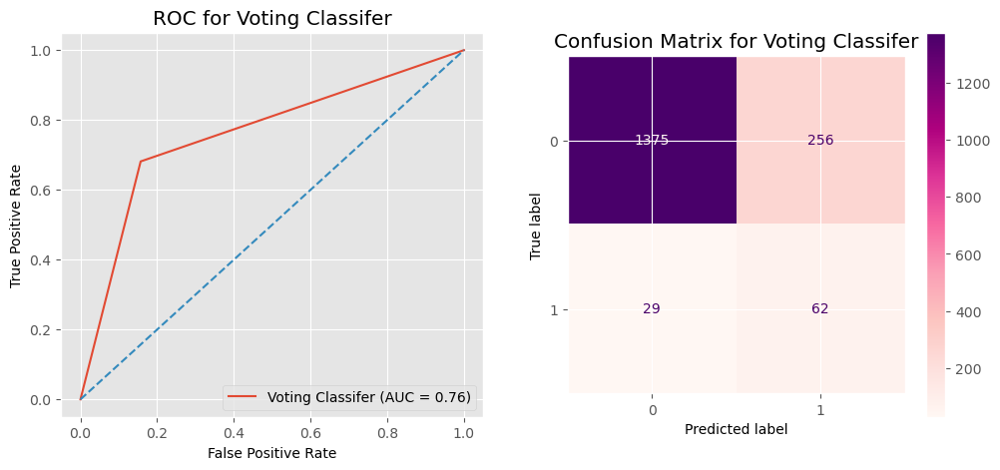

In [116]:
vc_model = get_model_score('Voting Classifer', X_train, X_test, y_train, y_test, vc_pipe, vc_params)

## Kaggle Submission

Lets prepare the Training dataset for final model

Preparation for the test dataset.

In [117]:
X_test_df = test_merge_df[num_list + cat_list]

### Logistic Regression Model 

In [118]:
# Fit final Logistric Regression model
final_lr_pipe = Pipeline([
    ('ohe', ohe_trf),
    ('smote', SMOTE(k_neighbors=7, random_state=RS)),
    ('ss', StandardScaler()),
    ('lr', LogisticRegression(random_state = RS, max_iter=5000, C=1.0))
])
final_lr_pipe.fit(X, y)

Pipeline(steps=[('ohe',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('enc',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['species', 'street',
                                                   'trap'])])),
                ('smote', SMOTE(k_neighbors=7, random_state=42)),
                ('ss', StandardScaler()),
                ('lr', LogisticRegression(max_iter=5000, random_state=42))])

In [119]:
# Make prediction on the test dataset
final_lr_y_pred_proba = final_lr_pipe.predict_proba(X_test_df)[:,1]
final_lr_y_pred_proba

array([1.98538875e-03, 6.90145008e-04, 2.74331814e-03, ...,
       1.74765813e-03, 2.99479030e-01, 1.78490798e-05])

Preparing the submission csv file.

In [120]:
kaggle_sub_lr = pd.DataFrame(test_df['id'])
kaggle_sub_lr.rename(columns={'id':'Id'}, inplace=True)

In [121]:
# Add in the the prediction
kaggle_sub_lr['WnvPresent'] = final_lr_y_pred_proba

In [122]:
# Un-comment to create csv
# kaggle_sub_lr.to_csv('../assets/NWX_submission_09.csv', index=False)

### Random Forest Classifier Model 

In [123]:
# Fit final Logistric Regression model
final_rf_pipe = Pipeline([
    ('ohe', ohe_trf),
    ('smote', SMOTE(k_neighbors=3, random_state=RS)),
    ('ss', StandardScaler()),
    ('rf', RandomForestClassifier(random_state=RS, max_depth=6, n_estimators=250))
])

final_rf_pipe.fit(X, y)

Pipeline(steps=[('ohe',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('enc',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['species', 'street',
                                                   'trap'])])),
                ('smote', SMOTE(k_neighbors=3, random_state=42)),
                ('ss', StandardScaler()),
                ('rf',
                 RandomForestClassifier(max_depth=6, n_estimators=250,
                                        random_state=42))])

In [124]:
# Make prediction on the test dataset
final_rf_y_pred_proba = final_rf_pipe.predict_proba(X_test_df)[:,1]
final_rf_y_pred_proba

array([0.13100568, 0.08340151, 0.1177335 , ..., 0.28881372, 0.28881372,
       0.28881372])

Preparing the submission csv file.

In [125]:
kaggle_sub_rf = pd.DataFrame(test_df['id'])
kaggle_sub_rf.rename(columns={'id':'Id'}, inplace=True)

In [126]:
# Add in the the prediction
kaggle_sub_rf['WnvPresent'] = final_rf_y_pred_proba

In [127]:
# Un-comment to create csv
# kaggle_sub_rf.to_csv('../assets/NWX_submission_10.csv', index=False)

### XGBoost Model 

In [128]:
# Fit final Logistric Regression model
final_xgb_pipe = Pipeline([
    ('ohe', ohe_trf),
    ('smote', SMOTE(k_neighbors=7, random_state=RS)),
    ('ss', StandardScaler()),
    ('xgb', XGBClassifier(random_state = RS, learning_rate=0.1, max_depth=5, n_estimators=200))
])
final_xgb_pipe.fit(X, y)

Pipeline(steps=[('ohe',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('enc',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['species', 'street',
                                                   'trap'])])),
                ('smote', SMOTE(k_neighbors=7, random_state=42)),
                ('ss', StandardScaler()),
                ('xgb',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_byno...
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=5, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=200,
                               n_jobs=None, num_parallel_tree=None,
                               predictor=None, random_state=42, ...))])

In [129]:
# Make prediction on the test dataset
final_xgb_y_pred_proba = final_xgb_pipe.predict_proba(X_test_df)[:,1]
final_xgb_y_pred_proba

array([0.00635816, 0.00628551, 0.00660769, ..., 0.12742835, 0.12742835,
       0.12742835], dtype=float32)

Preparing the submission csv file.

In [130]:
kaggle_sub_xgb = pd.DataFrame(test_df['id'])
kaggle_sub_xgb.rename(columns={'id':'Id'}, inplace=True)

In [131]:
# Add in the the prediction
kaggle_sub_xgb['WnvPresent'] = final_xgb_y_pred_proba

In [132]:
# Un-comment to create csv
# kaggle_sub_xgb.to_csv('../assets/NWX_submission_11.csv', index=False)

### AdaBoost Classifier Model 

In [133]:
# Fit final Logistric Regression model
final_ada_pipe = Pipeline([
    ('ohe', ohe_trf),
    ('smote', SMOTE(k_neighbors=3, random_state=RS)),
    ('ss', StandardScaler()),
    ('ada', AdaBoostClassifier(random_state = RS, learning_rate=0.05, n_estimators=300))
])

final_ada_pipe.fit(X, y)

Pipeline(steps=[('ohe',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('enc',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['species', 'street',
                                                   'trap'])])),
                ('smote', SMOTE(k_neighbors=3, random_state=42)),
                ('ss', StandardScaler()),
                ('ada',
                 AdaBoostClassifier(learning_rate=0.05, n_estimators=300,
                                    random_state=42))])

In [134]:
# Make prediction on the test dataset
final_ada_y_pred_proba = final_ada_pipe.predict_proba(X_test_df)[:,1]
final_ada_y_pred_proba

array([0.43858623, 0.41691651, 0.44371036, ..., 0.46173856, 0.46173856,
       0.46173856])

Preparing the submission csv file.

In [135]:
kaggle_sub_ada = pd.DataFrame(test_df['id'])
kaggle_sub_ada.rename(columns={'id':'Id'}, inplace=True)

In [136]:
# Add in the the prediction
kaggle_sub_ada['WnvPresent'] = final_ada_y_pred_proba

In [137]:
# Un-comment to create csv
# kaggle_sub_ada.to_csv('../assets/NWX_submission_12.csv', index=False)

In [138]:
#save the model to disk (Un-comment to save the file)
filename = 'ada_model.pkl'
# pickle.dump(final_ada_pipe, open(filename, 'wb'))

### Voting Classifier Model 

In [139]:
# Define the Voting Classifier
vclf = VotingClassifier(estimators=[ 
        ('lr', LogisticRegression(random_state = RS, max_iter=5000, C=1.0)), 
        ('rf', RandomForestClassifier(random_state=RS, max_depth=6, n_estimators=250)),
        ('xgb', XGBClassifier(random_state = RS, learning_rate=0.1, max_depth=5, n_estimators=200)),
        ('ada', AdaBoostClassifier(random_state = RS, learning_rate=0.05, n_estimators=300))
], voting='soft', weights=[1,1,1,2])

# Fit final Logistric Regression model
final_vc_pipe = Pipeline([
    ('ohe', ohe_trf),
    ('smote', SMOTE(k_neighbors=7, random_state=RS)),
    ('ss', StandardScaler()),
    ('vc', vclf)
])

final_vc_pipe.fit(X, y)

Pipeline(steps=[('ohe',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('enc',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['species', 'street',
                                                   'trap'])])),
                ('smote', SMOTE(k_neighbors=7, random_state=42)),
                ('ss', StandardScaler()),
                ('vc',
                 VotingClassifier(estimators=[('lr',
                                               LogisticRegression(max_iter=5000,
                                                                  random_state=42)),
                                              ('rf',
                                               Rand...
                                                             max_cat_threshold=None,
                                                             max_cat_to_onehot=None,
                                                             max_delta_step=None,
                                                             max_depth=5,
                                                             max_leaves=None,
                                                             min_child_weight=None,
                                                             missing=nan,
                                                             monotone_constraints=None,
                                                             n_estimators=200,
                                                             n_jobs=None,
                                                             num_parallel_tree=None,
                                                             predictor=None,
                                                             random_state=42, ...)),
                                              ('ada',
                                               AdaBoostClassifier(learning_rate=0.05,
                                                                  n_estimators=300,
                                                                  random_state=42))],
                                  voting='soft', weights=[1, 1, 1, 2]))])

In [140]:
# Make prediction on the test dataset
final_vc_y_pred_proba = final_vc_pipe.predict_proba(X_test_df)[:,1]
final_vc_y_pred_proba

array([0.20213294, 0.18435616, 0.20501928, ..., 0.27155643, 0.3311027 ,
       0.27121047])

Preparing the submission csv file.

In [141]:
kaggle_sub_vc = pd.DataFrame(test_df['id'])
kaggle_sub_vc.rename(columns={'id':'Id'}, inplace=True)

In [142]:
# Add in the the prediction
kaggle_sub_vc['WnvPresent'] = final_vc_y_pred_proba

In [143]:
# Un-comment to create csv
# kaggle_sub_vc.to_csv('../assets/NWX_submission_13.csv', index=False)

#### Kaggle Results

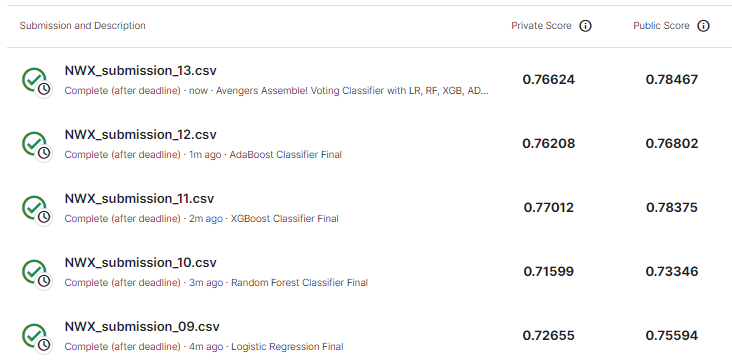

# Conclusion

### Key Insights
* ??

### Key Recommendations

### 1. Time your effort
- May to October: Economist Approach
- November to April: Minimalist Approach

### 2. Focus on culex pipiens populated areas
<br>

### 3. Understand the Priority
- **Effectiveness Ranking**
<br>
Protective Educations > Early Detection > Intervention > Medical
- **Cost Ranking**
<br>
Protective Educations < Early Detection < Intervention < Medical


### Future Work
- ??